# Plot all RSMD data

In [1]:
import os
import re
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
data_folder = "data/md_traj_analysis/"

In [47]:
files = glob.glob(data_folder+'*rmsd_C-alpha.xvg')

In [48]:
clean_line = lambda line: list(map(float, line.strip().split()))
exclude_regex = lambda line: not re.search("#|@",line)

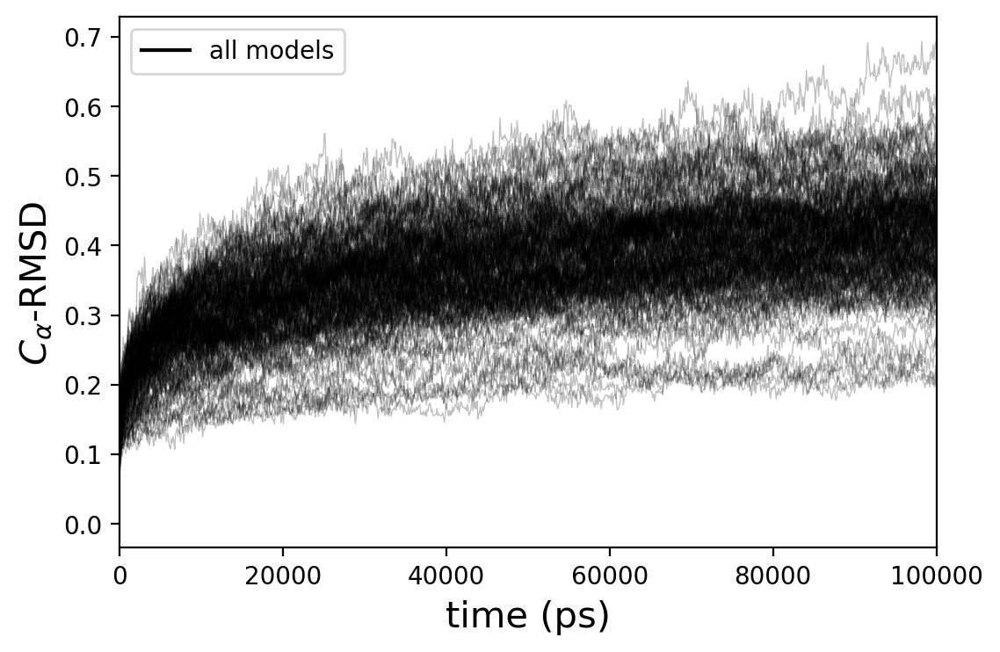

In [49]:
fig,ax = plt.subplots(1,1,dpi=200)

for path in files:
    data = [clean_line(l)  for l in open(path,'r').readlines() if exclude_regex(l)]
    data = np.array(data)
    
    ax.plot(*data.T,color="k",lw=0.5,alpha=0.25)

ax.plot([],[],color="k",label="all models")
    
ax.set_xlabel("time (ps)", fontsize=15)
ax.set_ylabel("$C_\\alpha$-RMSD", fontsize=15)

ax.set_xlim(0,100000)

ax.legend(loc="best",fontsize=10)
plt.show()

# Plot RMSD per mutant and conformation

In [50]:
data_folder = "data/md_traj_analysis/"

In [51]:
clean_line = lambda line: list(map(float, line.strip().split()))
exclude_regex = lambda line: not re.search("#|@",line)

In [52]:
mutant_names = ['cWza', 'cWza-K375C', 'cWza-S355C', 'cWza-Y373C']

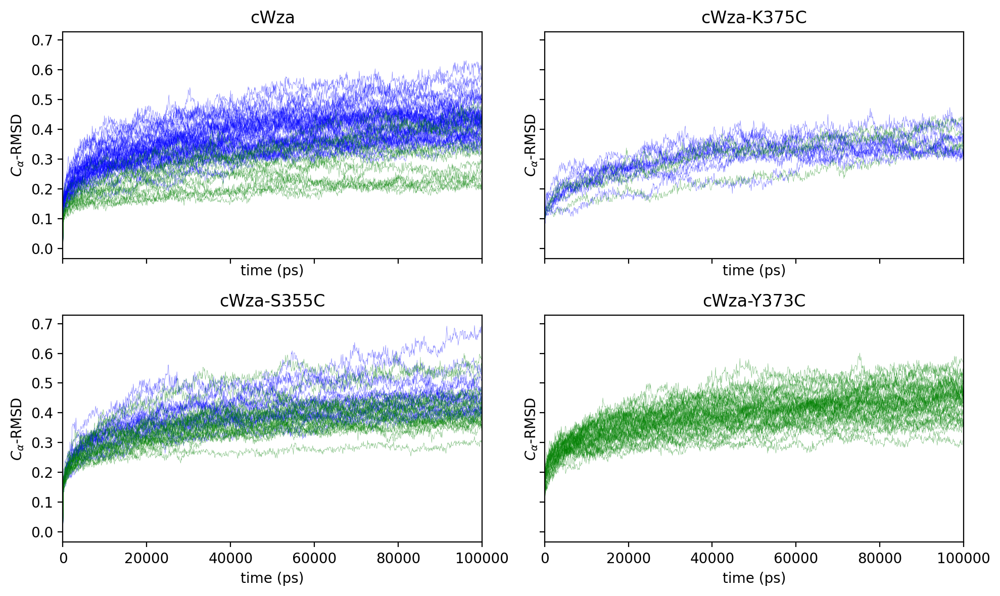

In [53]:
fig, ax = plt.subplots(2,2,figsize=(10,6),dpi=200, sharex=True, sharey=True)

Axes = {
    'cWza': ax[0][0],
    'cWza-K375C': ax[0][1],
    'cWza-S355C': ax[1][0],
    'cWza-Y373C': ax[1][1]
}

Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

Colors = {0:"blue", 1:'green'}

for mutant in mutant_names:
    ax = Axes[mutant]
    for g in Conformations[mutant]: 
        files=glob.glob(data_folder+mutant+'_'+'conformation'+str(g)+'_'+'*rmsd_C-alpha.xvg')
        
        for path in files:
            data = [clean_line(l) for l in open(
                path, 'r').readlines() if exclude_regex(l)]
            data = np.array(data)

            ax.plot(*data.T, color=Colors[g], lw=0.25, alpha=0.5)

    ax.set_title(mutant)
    ax.set_xlabel("time (ps)", fontsize=10)
    ax.set_ylabel("$C_\\alpha$-RMSD", fontsize=10)

    ax.set_xlim(0, 100000)

fig.tight_layout()
plt.show()

# RMSD distributions: Last 10ns MD

In [54]:
data_folder = "data/md_traj_analysis/"

In [55]:
clean_line = lambda line: list(map(float, line.strip().split()))
exclude_regex = lambda line: not re.search("#|@",line)

In [56]:
mutant_names = ['cWza', 'cWza-K375C', 'cWza-S355C', 'cWza-Y373C']

## Distribution from RMSD trajectory data

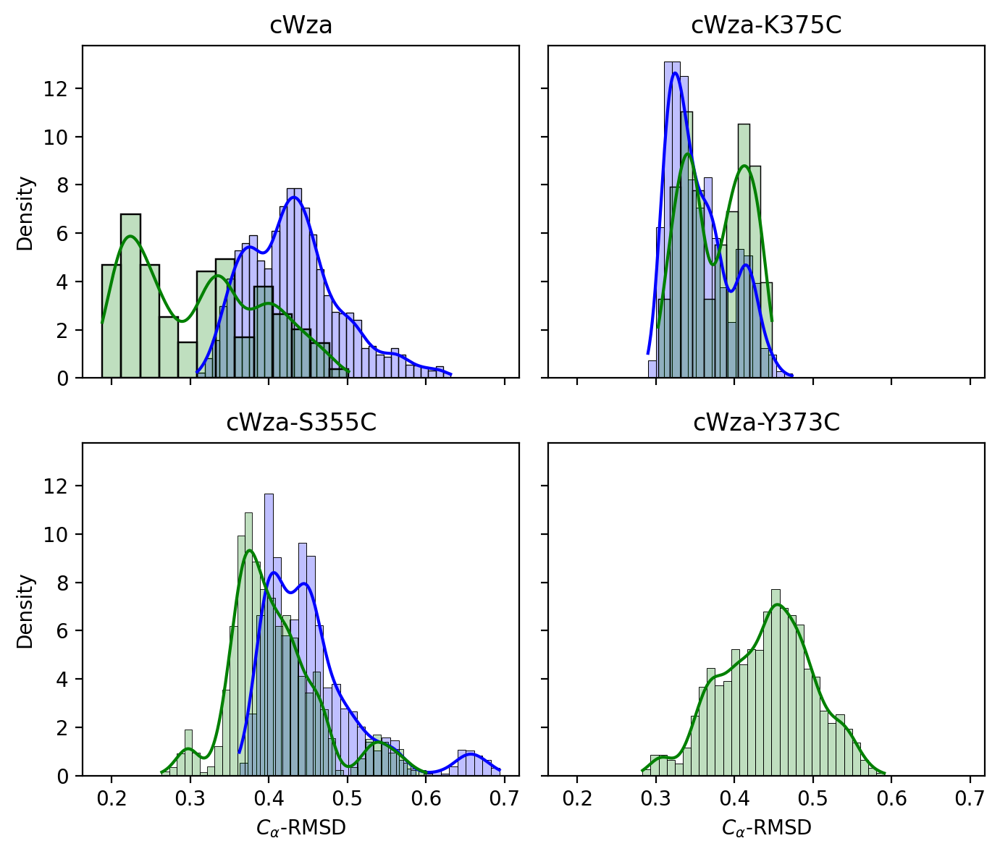

In [57]:
fig, ax = plt.subplots(2,2,figsize=(7,6),dpi=200, sharex=True, sharey=True)

Axes = {
    'cWza': ax[0][0],
    'cWza-K375C': ax[0][1],
    'cWza-S355C': ax[1][0],
    'cWza-Y373C': ax[1][1]
}

Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

Colors = {0:"blue", 1:'green'}

time_threshold_ps = 90000 # picoseconds

for mutant in mutant_names:
    ax = Axes[mutant]
    
    for g in Conformations[mutant]:
        
        data_last_10ns = []
        
        files=glob.glob(data_folder+mutant+'_'+'conformation'+str(g)+'_'+'*rmsd_C-alpha.xvg')
        
        for path in files:
            data = [clean_line(l) for l in open(
                path, 'r').readlines() if exclude_regex(l)]
            data = np.array(data)
            
            time, value = data.T
            data_last_10ns = data_last_10ns + list(data[time > time_threshold_ps].T[-1])

        sns.histplot(data=data_last_10ns, stat="density", kde=True, color=Colors[g], alpha=0.25, ax=ax)

    ax.set_title(mutant)
    ax.set_xlabel("$C_\\alpha$-RMSD", fontsize=10)
    ax.set_ylabel("Density", fontsize=10)

fig.tight_layout()
plt.show()

## Distribution from mean RMSD trajectory data

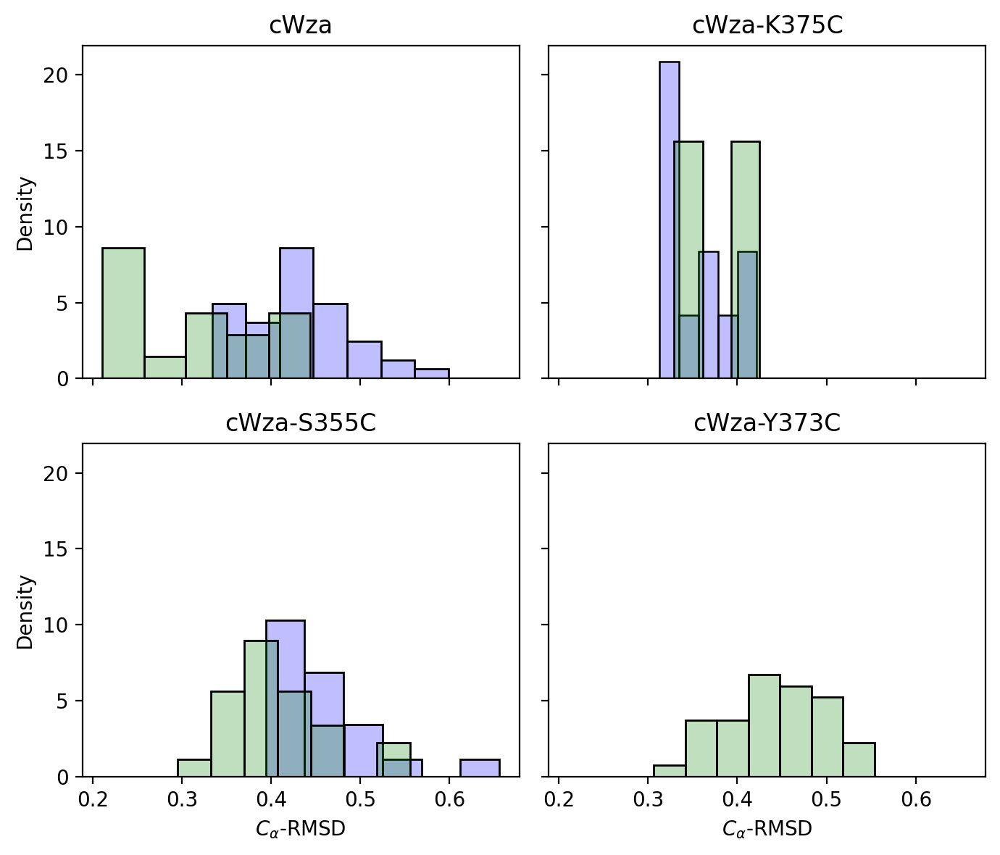

In [58]:
fig, ax = plt.subplots(2,2,figsize=(7,6),dpi=200, sharex=True, sharey=True)

Axes = {
    'cWza': ax[0][0],
    'cWza-K375C': ax[0][1],
    'cWza-S355C': ax[1][0],
    'cWza-Y373C': ax[1][1]
}

Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

Colors = {0:"blue", 1:'green'}

time_threshold = 90000 # picosecs

for mutant in mutant_names:
    ax = Axes[mutant]
    
    for g in Conformations[mutant]:
        
        data_last_10ns = []
        
        files=glob.glob(data_folder+mutant+'_'+'conformation'+str(g)+'_'+'*rmsd_C-alpha.xvg')
        
        for path in files:
            data = [clean_line(l) for l in open(
                path, 'r').readlines() if exclude_regex(l)]
            data = np.array(data)
            
            time, value = data.T
            if len(data[time > 90000].T[-1]) > 0:
                data_last_10ns.append( np.mean(data[time > time_threshold].T[-1]) )
        
        sns.histplot(data=data_last_10ns, stat="density", color=Colors[g], alpha=0.25, ax=ax)

    ax.set_title(mutant)
    ax.set_xlabel("$C_\\alpha$-RMSD", fontsize=10)
    ax.set_ylabel("Density", fontsize=10)

fig.tight_layout()
plt.show()

## Rank models: Low-to-High Mean-RMSD (90-100ns)

In [59]:
TOP_LOWEST_RMSD_MODELS = {
    'cWza': {0:[], 1:[]},
    'cWza-K375C': {0:[], 1:[]},
    'cWza-S355C': {0:[], 1:[]},
    'cWza-Y373C': {1:[]}    
}

In [60]:
N_models = 10

In [61]:
Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

datafile_suffix = '_md_100ns_rmsd_C-alpha.xvg'

time_threshold = 90000 # pico-secs
for mutant in mutant_names:
    TOP_LOWEST_RMSD_MODELS[mutant] = {}
    
    for group in Conformations[mutant]:
        data_output = []
        
        files=glob.glob(data_folder+mutant+'_'+'conformation'+str(group)+'_*'+datafile_suffix)
        
        for path in files:
            data = [clean_line(l) for l in open(
                path, 'r').readlines() if exclude_regex(l)]
            data = np.array(data)
            
            time, value = data.T
            rmsd_data = data[time > time_threshold].T[-1]
            model_labels = path.split('/')[-1].split(datafile_suffix)[0]
            
            if len(rmsd_data) > 0: # check for empty dataset
                data_output.append([np.mean(rmsd_data), model_labels])
        
        #sort data by RMSD (low to high)        
        TOP_LOWEST_RMSD_MODELS[mutant][group] = sorted(data_output, key=lambda x: x[0])[:N_models]

Print out data

In [62]:
import pandas as pd
pd.set_option("display.max_colwidth", None)
pd.set_option('display.colheader_justify', 'center')

In [63]:
model_lowest_rmsd = []
for mutant in mutant_names:
    for group in Conformations[mutant]:
        for item in TOP_LOWEST_RMSD_MODELS[mutant][group]:
            model_lowest_rmsd.append(item)
            
df = pd.DataFrame(model_lowest_rmsd, columns=['Mean RMSD (90-100ns)[nm]', 'Model tags'])
df.style.set_properties(**{'text-align': 'center'})

,Mean RMSD (90-100ns)[nm],Model tags
0,0.334172,cWza_conformation0_refined1_0001_INPUT_0231_ignorechain
1,0.345286,cWza_conformation0_refined1_0001_INPUT_0227_ignorechain
2,0.353893,cWza_conformation0_refined1_0001_INPUT_0742_ignorechain
3,0.357059,cWza_conformation0_refined1_0001_INPUT_0843_ignorechain
4,0.359771,cWza_conformation0_refined1_0001_INPUT_0736_ignorechain
5,0.362919,cWza_conformation0_refined1_0001_INPUT_0553_ignorechain
6,0.366797,cWza_conformation0_refined1_0001_INPUT_0813_ignorechain
7,0.368353,cWza_conformation0_refined1_0001_INPUT_0595_ignorechain
8,0.379361,cWza_conformation0_refined1_0001_INPUT_0188_ignorechain
9,0.382846,cWza_conformation0_refined1_0001_INPUT_0433_ignorechain


### Plot RMSD data

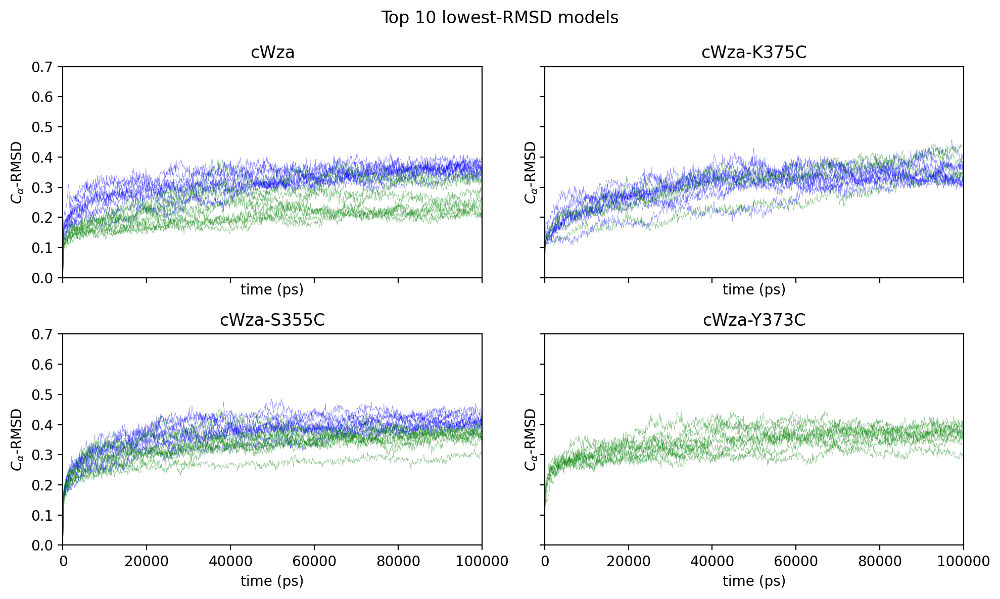

In [64]:
fig, ax = plt.subplots(2,2,figsize=(10,6),dpi=200, sharex=True, sharey=True)

Axes = {
    'cWza': ax[0][0],
    'cWza-K375C': ax[0][1],
    'cWza-S355C': ax[1][0],
    'cWza-Y373C': ax[1][1]
}

Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

Colors = {0:"blue", 1:'green'}

datafile_suffix = '_md_100ns_rmsd_C-alpha.xvg'

for mutant in mutant_names:
    ax = Axes[mutant]
    
    for group in Conformations[mutant]:
        data_models = TOP_LOWEST_RMSD_MODELS[mutant][group]
        
        for i in range(len(data_models)):
            model_tags = data_models[i][-1]
            path = data_folder+model_tags+datafile_suffix
        
            rmsd_data = [clean_line(l) for l in open(
                path, 'r').readlines() if exclude_regex(l)]
            rmsd_data = np.array(rmsd_data)
            
            ax.plot(*rmsd_data.T, color=Colors[group], lw=0.25, alpha=0.5)

    ax.set_title(mutant)
    ax.set_xlabel("time (ps)", fontsize=10)
    ax.set_ylabel("$C_\\alpha$-RMSD", fontsize=10)

     
ax.set_xlim(0, 100000)
ax.set_ylim(0, 0.7)

suptitle = "Top "+str(N_models)+" lowest-RMSD models"
fig.suptitle(suptitle)

fig.tight_layout()
plt.show()

### Lowest-RMSD models

In [65]:
import pandas as pd
pd.set_option("display.max_colwidth", None)
pd.set_option('display.colheader_justify', 'center')

In [66]:
model_lowest_rmsd = []
for mutant in mutant_names:
    for group in Conformations[mutant]:
        model_lowest_rmsd.append(TOP_LOWEST_RMSD_MODELS[mutant][group][0])

df = pd.DataFrame(model_lowest_rmsd, columns=['Mean RMSD (90-100ns)[nm]', 'Model tags'])
df.style.set_properties(**{'text-align': 'center'})

,Mean RMSD (90-100ns)[nm],Model tags
0,0.334172,cWza_conformation0_refined1_0001_INPUT_0231_ignorechain
1,0.210962,cWza_conformation1_refined1_0001_INPUT_0198_ignorechain
2,0.313111,cWza-K375C_conformation0_refined1_0001_INPUT_0645_ignorechain
3,0.329132,cWza-K375C_conformation1_refined1_0001_INPUT_0448_ignorechain
4,0.394105,cWza-S355C_conformation0_refined1_0001_INPUT_0273_ignorechain
5,0.295457,cWza-S355C_conformation1_refined1_0001_INPUT_0050_ignorechain
6,0.306335,cWza-Y373C_conformation1_refined1_0001_INPUT_0337_ignorechain


Plot their RMSD

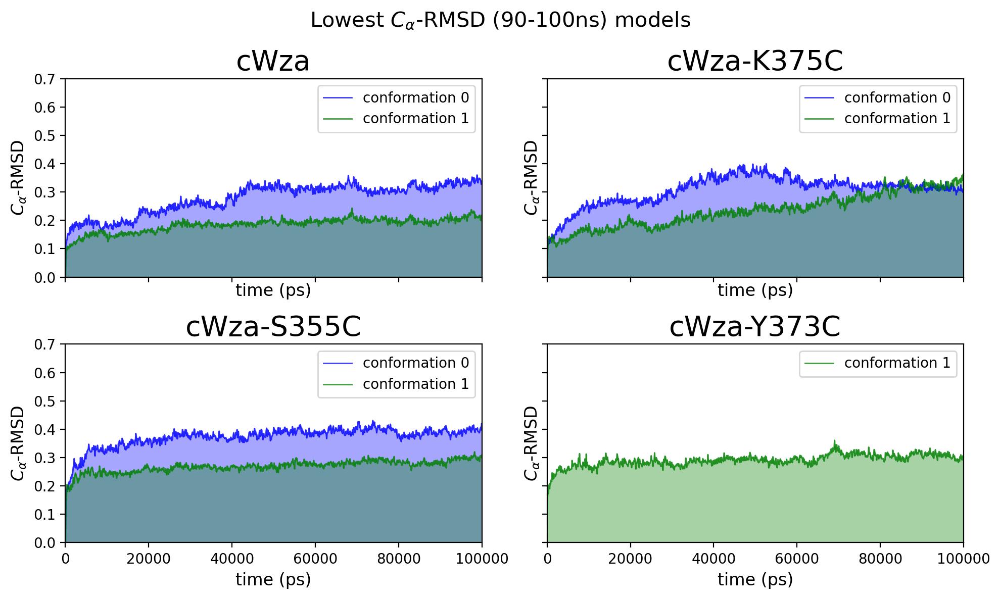

In [82]:
fig, ax = plt.subplots(2,2,figsize=(10,6),dpi=200, sharex=True, sharey=True)

Axes = {
    'cWza': ax[0][0],
    'cWza-K375C': ax[0][1],
    'cWza-S355C': ax[1][0],
    'cWza-Y373C': ax[1][1]
}

Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

Colors = {0:"blue", 1:'green'}

datafile_suffix = '_md_100ns_rmsd_C-alpha.xvg'

for mutant in mutant_names:
    ax = Axes[mutant]
    for group in Conformations[mutant]:
        
        data_models = TOP_LOWEST_RMSD_MODELS[mutant][group]
        model_tags = data_models[0][-1] #data lowest-RMSD model
        path = data_folder+model_tags+datafile_suffix

        rmsd_data = [clean_line(l) for l in open(
            path, 'r').readlines() if exclude_regex(l)]
        rmsd_data = np.array(rmsd_data)
        
        zorder = -int(np.mean(rmsd_data.T[-1])*100)
        color = Colors[group]
        ax.fill_between(*rmsd_data.T, color=color, lw=1, alpha=0.35, zorder=zorder)
#         ax.plot(*rmsd_data.T, color=color, lw=1, label=model_tags, alpha=0.75)
        ax.plot(*rmsd_data.T, color=color, lw=1, label='conformation '+str(group), alpha=0.75)

# ax.set_title("Lowest-RMSD models")
# ax.set_xlabel("time (ps)", fontsize=15)
# ax.set_ylabel("$C_\\alpha$-RMSD", fontsize=15)
        ax.set_title(mutant,fontsize=20)
        ax.set_xlabel("time (ps)", fontsize=12)
        ax.set_ylabel("$C_\\alpha$-RMSD", fontsize=12)
        ax.set_xlim(0, 100000)
        ax.set_ylim(0, 0.7)
        ax.legend(loc="best")

fig.suptitle("Lowest MD $C_{\\alpha}$-RMSD models",fontsize=15)
fig.tight_layout()
plt.show()

### Model comparisons

Slides featuring screenshots of the RMSD-selected models with respect to their original docking models and a model of wild-type Wza-D4 can be found [here](https://docs.google.com/presentation/d/1Ryon7fEflKvDhcPjxK3FlRhvZy-cCCIRbUz0G-e56RQ/edit?usp=sharing)

# Conductance calulations

In [35]:
models_paths = [
"cWza/conformation0/refined1_0001_INPUT_0231_ignorechain/",
"cWza/conformation1/refined1_0001_INPUT_0198_ignorechain/",
"cWza-K375C/conformation0/refined1_0001_INPUT_0645_ignorechain/",
"cWza-K375C/conformation1/refined1_0001_INPUT_0448_ignorechain/",
"cWza-S355C/conformation0/refined1_0001_INPUT_0273_ignorechain/",
"cWza-S355C/conformation1/refined1_0001_INPUT_0050_ignorechain/",
"cWza-Y373C/conformation1/refined1_0001_INPUT_0337_ignorechain/"
]

In [36]:
infile = "data/md_selected_models/HOLE_conductance_data_selected_models.txt"

Gmacro_data = []
data = []
for l in open(infile, 'r').readlines():
    if "&" not in l:
        G = l.split()[7] # Gpred Rmin
        #G = l.split()[5] # Gmacro
        data.append(0.001*float(G))
    else:
        Gmacro_data.append(data)
        next
        data = []

## Figures: all mutants and conformations

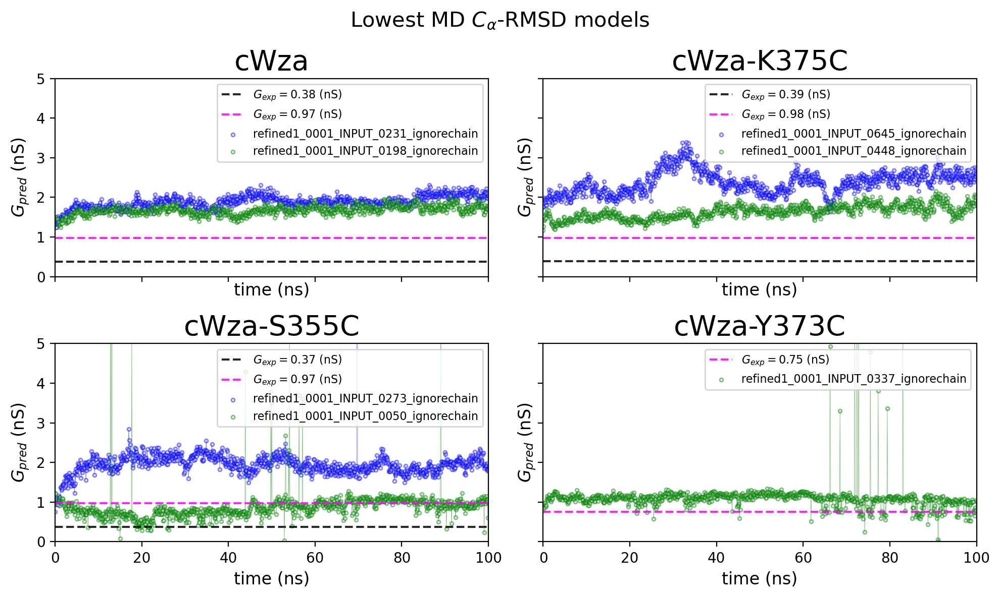

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(2,2,figsize=(10,6),sharex=True,sharey=True,dpi=200)

# axes per mutant
Axes = {
    'cWza': ax[0][0],
    'cWza-K375C': ax[0][1],
    'cWza-S355C': ax[1][0],
    'cWza-Y373C': ax[1][1]
}

# conformations per mutant
Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

# colours per conformation
Colors = {0:"blue", 1:'green'}

# Experimental conductance values
G_exp = [0.38, 0.97, 0.39, 0.98, 0.37, 0.97, 0.75]
Colors_exp = ['black','magenta','black','magenta','black','magenta','magenta']

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

for i in range(len(Gmacro_data)):
    mutant, conformation, pdbname = models_paths[i].split('/')[:3]
    
    ax = Axes[mutant]
    color = Colors[int(conformation[-1])]
    dataset = np.array(Gmacro_data[i]).T
    label = models_paths[i]
    
    ax.plot(timeline,dataset,color=color,lw=0.3,alpha=0.5)
    
    label = pdbname
    ax.scatter(timeline, dataset, s=6, color='white', edgecolor=color, label=label, alpha=0.5)
    
    label = '$G_{exp} = $'+str(G_exp[i])+' (nS)'
    ax.plot((0,100), 2*[G_exp[i]], lw=1.5, linestyle='--', color=Colors_exp[i], label=label, alpha=0.85)
    
    # customise panels
    ax.legend(loc='upper right', fontsize=8)
    ax.set_title(mutant,fontsize=20)
    ax.set_xlabel("time (ns)", fontsize=12)
    ax.set_ylabel("$G_{pred}$ (nS)", fontsize=12)
    ax.set_xlim(0,100)
    ax.set_ylim(0,5)
    ax.grid(False)

# further customise plot
suptitle = "Lowest MD $C_{\\alpha}$-RMSD models"
fig.suptitle(suptitle, fontsize=15)
fig.tight_layout()
plt.show()

## Figures: selected mutants

### cWza-S355C

Features:

* Match length of H-bond plots per mutant
* Plot data for single model 

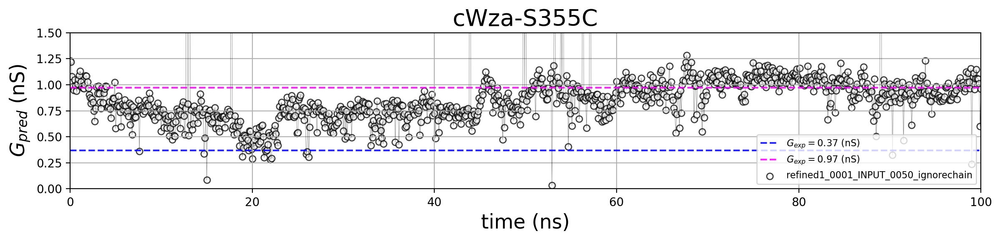

In [90]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(1,1,figsize=(12,3),sharex=True,sharey=True,dpi=200)

# model identifiers
mutant = 'cWza-S355C'
conformation = '1'
pdbname = "refined1_0001_INPUT_0050_ignorechain"

# timeline
t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)
# Gpred (HOLE predicted conductance) timeseries
dataset = np.array(Gmacro_data[5]).T

# plot scatterdata points
label = pdbname
ax.scatter(timeline, dataset, s=30, color='white', edgecolor='black', label=label, alpha=0.75)
# plot lines 
ax.plot(timeline,dataset,color='black',lw=0.3,alpha=0.5)
# plot reference lines (experimental conductance values)
G_exp = [0.37, 0.97]
colors_G_exp = ['blue','magenta']
for i in range(len(G_exp)):
    label = '$G_{exp} = $'+str(G_exp[i])+' (nS)'
    ax.plot(
        (t_initial,t_final), 
        2*[G_exp[i]], 
        lw=1.5, 
        linestyle='--', 
        color=colors_G_exp[i], 
        label=label, 
        alpha=0.85
    )

# customise panels
ax.legend(loc='lower right', fontsize=8)
ax.set_title(mutant,fontsize=20)
ax.set_xlabel("time (ns)", fontsize=17)
ax.set_ylabel("$G_{pred}$ (nS)", fontsize=17)
ax.set_xlim(0,100)
ax.set_ylim(0,1.5)
ax.grid(True)

fig.tight_layout()
plt.show()

### cWza-Y373C

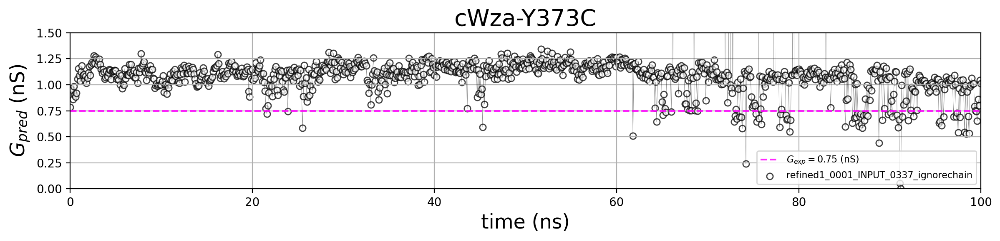

In [91]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(1,1,figsize=(12,3),sharex=True,sharey=True,dpi=200)

# model identifiers
mutant = 'cWza-Y373C'
conformation = '1'
pdbname = "refined1_0001_INPUT_0337_ignorechain"

# timeline
t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)
# Gpred (HOLE predicted conductance) timeseries
dataset = np.array(Gmacro_data[6]).T

# plot scatterdata points
label = pdbname
ax.scatter(timeline, dataset, s=30, color='white', edgecolor='black', label=label, alpha=0.75)
# plot lines 
ax.plot(timeline,dataset,color='black',lw=0.3,alpha=0.5)
# plot reference lines (experimental conductance values)
G_exp = [0.75]
colors_G_exp = ['magenta']
for i in range(len(G_exp)):
    label = '$G_{exp} = $'+str(G_exp[i])+' (nS)'
    ax.plot(
        (t_initial,t_final), 
        2*[G_exp[i]], 
        lw=1.5, 
        linestyle='--', 
        color=colors_G_exp[i], 
        label=label, 
        alpha=0.85
    )

# customise panels
ax.legend(loc='lower right', fontsize=8)
ax.set_title(mutant,fontsize=20)
ax.set_xlabel("time (ns)", fontsize=17)
ax.set_ylabel("$G_{pred}$ (nS)", fontsize=17)
ax.set_xlim(0,100)
ax.set_ylim(0,1.5)
ax.grid(True)

fig.tight_layout()
plt.show()

HISTORGRAM

In [24]:
df = pd.DataFrame(columns=['G','model'])
for i in range(len(Gmacro_data)):
    dataset = np.array(Gmacro_data[i]).T
    df_per_model = pd.DataFrame(np.column_stack([dataset,np.tile([i],len(dataset))]), columns=['G','model'])
    df = df.append(df_per_model, ignore_index=True)

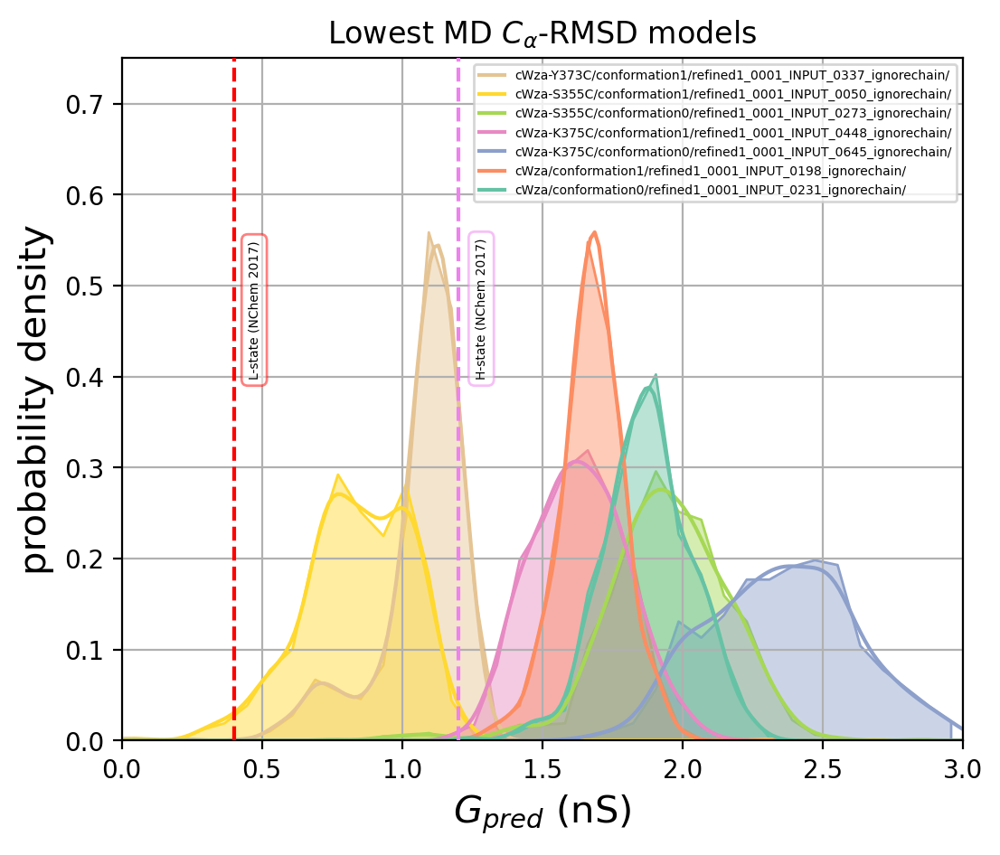

In [25]:
fig,ax = plt.subplots(1,1,figsize=(6,5),dpi=200)

histograms = sns.histplot(
    data=df[df.G < 3],
    x='G',
    hue='model',
    stat='density',
    kde=True,
    palette='Set2',
    element="poly",
    legend=False,
    alpha=0.45,
    ax=ax
)

labels = models_paths
labels.reverse()

histograms.legend(fontsize=5,facecolor='white',labels=labels)

ax.set_title("Lowest MD $C_{\\alpha}$-RMSD models")
ax.set_xlabel("$G_{pred}$ (nS)", fontsize=15)
ax.set_ylabel('probability density', fontsize=15)

ax.set_xlim(0,3)
ax.set_ylim(0,0.75)
ylims = ax.get_ylim()

# H-state cWza model (crystal structure)
Gpred_cWza_Hstate = [1.2]
ax.plot(2*Gpred_cWza_Hstate,ylims,lw=1.5,linestyle='--',color='violet',alpha=1,zorder=10)
ax.text(1.26,0.4,'H-state (NChem 2017)',rotation=90,fontsize=5,
        bbox=dict(facecolor='white',edgecolor='violet',alpha=0.5, boxstyle='round, pad=0.5'))

#L-state cWza model (CCBuilder and BUDE optimised)
Gpred_cWza_Lstate = [0.4]
ax.plot(2*Gpred_cWza_Lstate,ylims,lw=1.5,linestyle='--',color='red',alpha=1,zorder=10)
plt.text(0.45,0.4,'L-state (NChem 2017)',rotation=90,fontsize=5,
        bbox=dict(facecolor='white',edgecolor='red',alpha=0.5,boxstyle='round, pad=0.5'))

ax.grid(True)
plt.show()

Code lines for protein frame extraction and HOLE execution

* List of relative paths in `paths_list_protein_extraction.txt` to directories containing `.xtc` MD trajectory files

```bash
cWza/conformation0/refined1_0001_INPUT_0231_ignorechain/
cWza/conformation1/refined1_0001_INPUT_0198_ignorechain/
cWza-K375C/conformation0/refined1_0001_INPUT_0645_ignorechain/
cWza-K375C/conformation1/refined1_0001_INPUT_0448_ignorechain/
cWza-S355C/conformation0/refined1_0001_INPUT_0273_ignorechain/
cWza-S355C/conformation1/refined1_0001_INPUT_0050_ignorechain/
cWza-Y373C/conformation1/refined1_0001_INPUT_0337_ignorechain/
```

* `bash` commands for using frame extraction Python script to store PDB frames in folder `md_100ns`


```bash
for path in `cat paths_list_protein_extraction.txt`; do 
    python ~/mpmodeling/tools/protein_frame_extractor.py md_100ns $path; 
done
```

* Inside the directory storing the PDB frames `run_hole` for every PDB file with prefix `Protein`

```bash
(for n in `seq 900 1000`; do run_hole Protein_${n}.pdb ; done) &
```

# Hbonds analysis

In [1]:
# fix sys.path to load MDAnalysis from conda packages
import sys
python_home_path = '/homes/sanjuan/.local/lib/python3.8/site-packages'
sys.path[sys.path.index(python_home_path)] = ''

import numpy as np
import MDAnalysis as mda
from MDAnalysis.analysis.hydrogenbonds.hbond_analysis import HydrogenBondAnalysis as HBA

SOURCE https://docs.mdanalysis.org/dev/documentation_pages/analysis/hydrogenbonds.html

## cWza-S355C 

<span style="color:red"><b>IMPORTANT</b></span> Only run this analysis if `hbond_analysis_data.pickle` doesn't exist. Takes about 7 minutes to generated the data from the topology and trajectory simulation files. 

### Count total H-bonds

Load topology and trajectory data files

In [68]:
import MDAnalysis as mda
workdir = "data/cWza-S355C_conformation1_0050/"
u = mda.Universe(workdir+'md_100ns.tpr', workdir+'md_100ns.xtc',in_memory=True)

Run Hydrogen bond analysis - takes about 2.5 mins

In [69]:
hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
hbonds.hydrogens_sel = hbonds.guess_hydrogens("protein")
hbonds.acceptors_sel = hbonds.guess_acceptors("protein")
hbonds.run()

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/core/topologyattrs.py:2261: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(sorted(unique_bonds)), 4)
/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/core/topologyobjects.py:600: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  guessed = np.asarray(guessed, dtype=np.bool)


Return the **total number** H-bonds during the simulation length

In [70]:
hbond_counting_raw = hbonds.count_by_type()
hbond_counting_sorted = sorted(hbond_counting_raw, key=lambda x: int(x[-1]), reverse=True)
hbond_counting_sorted

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/analysis/hydrogenbonds/hbond_analysis.py:539: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  d = self.u.atoms[self.hbonds[:, 1].astype(np.int)]
/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/analysis/hydrogenbonds/hbond_analysis.py:543: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar 

[array(['ARG:opls_300', 'ARG:opls_303', '48338'], dtype='<U21'),
 array(['ARG:opls_300', 'ARG:opls_300', '48314'], dtype='<U21'),
 array(['THR:opls_238', 'THR:opls_154', '29962'], dtype='<U21'),
 array(['ARG:opls_303', 'ARG:opls_300', '24773'], dtype='<U21'),
 array(['THR:opls_238', 'THR:opls_272', '7774'], dtype='<U21'),
 array(['ARG:opls_300', 'ASP:opls_272', '7179'], dtype='<U21'),
 array(['ARG:opls_300', 'GLU:opls_272', '4054'], dtype='<U21'),
 array(['HIS:opls_503', 'ASP:opls_272', '3403'], dtype='<U21'),
 array(['TYR:opls_167', 'GLU:opls_272', '2647'], dtype='<U21'),
 array(['ARG:opls_300', 'THR:opls_154', '2632'], dtype='<U21'),
 array(['THR:opls_154', 'ARG:opls_300', '1271'], dtype='<U21'),
 array(['ARG:opls_303', 'GLU:opls_272', '1254'], dtype='<U21'),
 array(['LYS:opls_287', 'GLU:opls_272', '1144'], dtype='<U21'),
 array(['THR:opls_154', 'THR:opls_272', '1089'], dtype='<U21'),
 array(['ARG:opls_300', 'THR:opls_272', '1088'], dtype='<U21'),
 array(['LYS:opls_287', 'THR:opls_27

Extract the residues contributing with most of the H-bonds during the simulation

In [71]:
data_destilated = hbond_counting_sorted[:16]
set_donors_acceptors = set([(x[0].split(':')[0], x[1].split(':')[0]) for x in data_destilated])
set_donors_acceptors

{('ARG', 'ARG'),
 ('ARG', 'ASP'),
 ('ARG', 'GLU'),
 ('ARG', 'THR'),
 ('HIS', 'ASP'),
 ('LYS', 'GLU'),
 ('LYS', 'THR'),
 ('THR', 'ARG'),
 ('THR', 'THR'),
 ('TYR', 'GLU')}

In [72]:
N_hbonds_types = len(hbond_counting_sorted)

Y = hbond_counting_sorted
N_hbonds_total_counting_sorted = sum([int(Y[i][-1]) for i in range(len(Y))])

X = data_destilated
N_hbonds_data_destilated = sum([int(X[i][-1]) for i in range(len(X))])

In [73]:
print("Total number of H-bond types: ", N_hbonds_types)
print("Total count of H-bonds during simulation: ", N_hbonds_total_counting_sorted)
print("Total count due to leading H-bonds: ", N_hbonds_data_destilated)
print("Fractional contribution to total", N_hbonds_data_destilated/N_hbonds_total_counting_sorted)

Total number of H-bond types:  58
Total count of H-bonds during simulation:  189768
Total count due to leading H-bonds:  185833
Fractional contribution to total 0.9792641541250369


QUESTIONS

* What are the leading H-bonds contributing with most of the counts during the simulation?
* How many residues are contribution with most of the H-bond counts during the simulation?
* What are their identities?

<span style="color:red">NOTE</span> The issue with the data from the two cells below is that it doesn't discriminate amino acids by their residue number. For example, `ARG`s are located near both terminal ends. 

In [74]:
X = hbond_counting_sorted
set_hdonors = set([x[0].split(':')[0] for x in X])
set_acceptors = set([x[1].split(':')[0] for x in X])
hbond_counting_residues = list(set_hdonors.union(set_acceptors))
print(len(hbond_counting_residues), hbond_counting_residues)

14 ['GLU', 'ILE', 'GLY', 'GLN', 'LEU', 'ARG', 'LYS', 'THR', 'ASN', 'TRP', 'TYR', 'ASP', 'VAL', 'HIS']


In [75]:
X = data_destilated
set_hdonors = set([x[0].split(':')[0] for x in X])
set_acceptors = set([x[1].split(':')[0] for x in X])
data_destilated_residues = list(set_hdonors.union(set_acceptors))
print(len(data_destilated_residues),data_destilated_residues)

7 ['LYS', 'THR', 'HIS', 'GLU', 'TYR', 'ASP', 'ARG']


### Count H-bonds by time

Count H-bonds **by time** for the donor-acceptor residues with the highest contribution to the total count. Takes about 4mins!

In [76]:
hbonds_time_counting = {}
for k in range(len(list(set_donors_acceptors))):
    # define donor-acceptor residues
    res_donor   = list(set_donors_acceptors)[k][0]
    res_acceptor = list(set_donors_acceptors)[k][1]
    
    # setup and execute hbond analysis
    hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
    hbonds.hydrogens_sel = hbonds.guess_hydrogens("resname "+res_donor)
    hbonds.acceptors_sel = hbonds.guess_acceptors("resname "+res_acceptor)
    hbonds.run()
    
    # store hbonds_time_counting 
    key = res_donor+'-'+res_acceptor
    hbonds_time_counting[key] = hbonds.count_by_time()
    
hbonds_time_counting

{'ARG-ARG': array([120, 121, 125, ..., 121, 120, 121]),
 'ARG-ASP': array([0, 0, 0, ..., 6, 6, 6]),
 'TYR-GLU': array([0, 1, 0, ..., 1, 2, 2]),
 'ARG-GLU': array([0, 0, 0, ..., 3, 3, 3]),
 'ARG-THR': array([8, 8, 7, ..., 6, 4, 4]),
 'LYS-GLU': array([0, 0, 0, ..., 3, 6, 6]),
 'HIS-ASP': array([0, 0, 1, ..., 4, 4, 4]),
 'LYS-THR': array([0, 0, 0, ..., 0, 0, 0]),
 'THR-ARG': array([3, 3, 2, ..., 3, 2, 2]),
 'THR-THR': array([44, 45, 41, ..., 40, 37, 38])}

### Leading H-bond contributors protein

In [77]:
set_hdonors = set([x[0].split(':')[0] for x in data_destilated])
set_acceptors = set([x[1].split(':')[0] for x in data_destilated])

In [78]:
list(set_hdonors.union(set_acceptors))

['LYS', 'THR', 'HIS', 'GLU', 'TYR', 'ASP', 'ARG']

In [79]:
hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
hbonds.hydrogens_sel = hbonds.guess_hydrogens("resname HIS TYR ARG ASP LYS GLU THR")
hbonds.acceptors_sel = hbonds.guess_acceptors("resname HIS TYR ARG ASP LYS GLU THR")
hbonds.run()

In [80]:
data_leading_residues = hbonds.count_by_time()

In [81]:
hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
hbonds.hydrogens_sel = hbonds.guess_hydrogens("protein")
hbonds.acceptors_sel = hbonds.guess_acceptors("protein")
hbonds.run()

In [82]:
data_protein = hbonds.count_by_time()

#### Appendix Figures

Compare H-bonds from leading residues forming H-bonds wrt the whole protein

In [83]:
import matplotlib.pyplot as plt

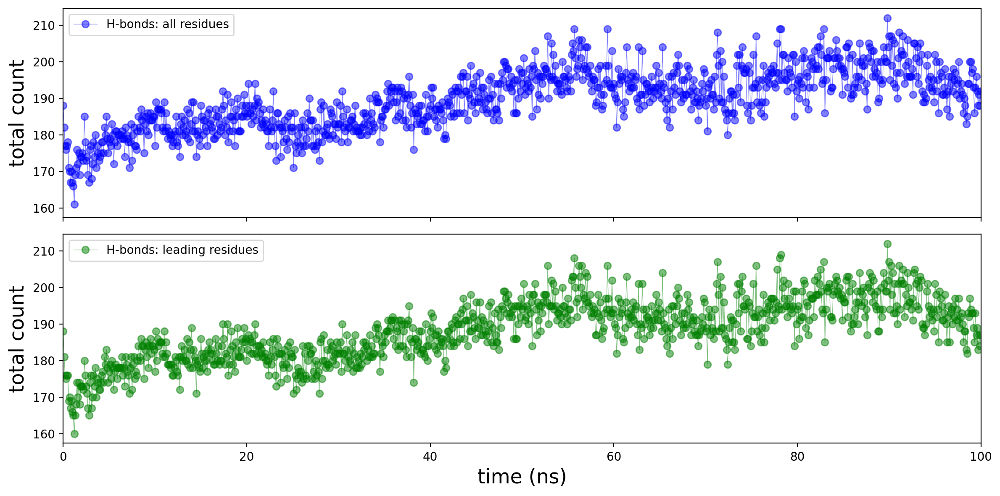

In [84]:
fig,ax = plt.subplots(2,1,figsize=(12,6),sharex=True,sharey=True,dpi=200)

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

ax[0].plot(
    timeline,
    data_protein,
    color='blue',
    marker='o',
    label='H-bonds: all residues',
    lw=0.5,
    alpha=0.5
)

ax[1].plot(
    timeline,
    data_leading_residues,
    color='green',
    marker='o',
    label='H-bonds: leading residues',
    lw=0.5,
    alpha=0.5
)

ax[0].legend()
ax[1].legend()
ax[1].set_xlim(0, 100)
ax[1].set_xlabel("time (ns)",fontsize=17)
ax[0].set_ylabel("total count",fontsize=17)
ax[1].set_ylabel("total count",fontsize=17)
fig.tight_layout()

plt.show()

#### Main article Figures

VERSION: Separate plots for main article body

Whole protein

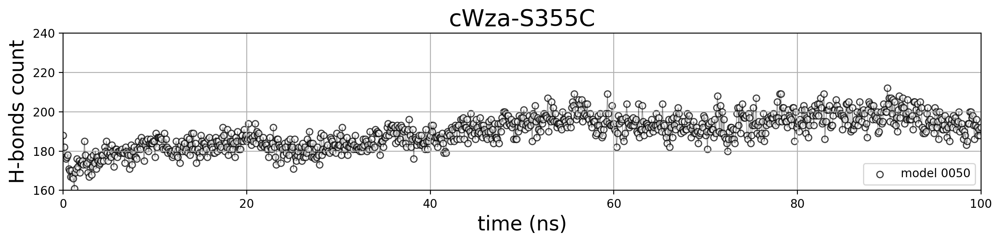

In [89]:
fig,ax = plt.subplots(1,1,figsize=(12,3),sharex=True,sharey=True,dpi=200)

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

label = "model 0050"
ax.plot(
    timeline,
    data_protein,
    color='black',
    lw=0.5,
    alpha=0.5
)

ax.scatter(
    timeline,
    data_protein,
    s = 30,
    color='white',  
    edgecolor='black',
    marker='o',
    label=label,
    lw=1,
    alpha=0.75
)

ax.legend(loc='lower right')
ax.set_xlim(0, 100)
ax.set_xlabel("time (ns)",fontsize=17)
ax.set_ylabel("H-bonds count",fontsize=17)
ax.set_title("cWza-S355C",fontsize=20)
ax.set_ylim(160, 240)
ax.grid(True)
fig.tight_layout()

plt.show()

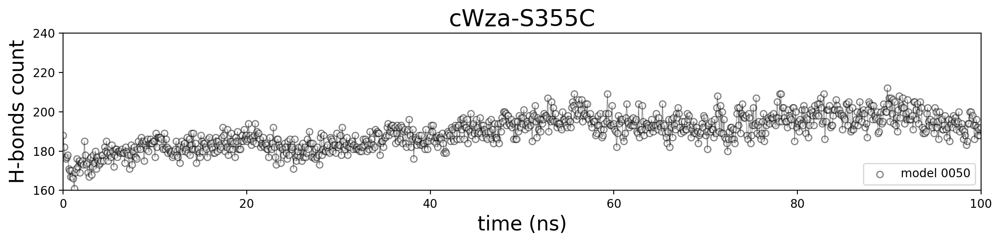

In [87]:
fig,ax = plt.subplots(1,1,figsize=(12,3),sharex=True,sharey=True,dpi=200)

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

label = "model 0050"
ax.plot(
    timeline,
    data_protein,
    color='black',
    lw=0.5,
    alpha=0.5
)

ax.scatter(
    timeline,
    data_protein,
    s = 30,
    color='white',  
    edgecolor='black',
    marker='o',
    label=label,
    lw=1,
    alpha=0.5
)

ax.legend(loc='lower right')
ax.set_xlim(0, 100)
ax.set_xlabel("time (ns)",fontsize=17)
ax.set_ylabel("H-bonds count",fontsize=17)
ax.set_title("cWza-S355C",fontsize=20)
ax.set_ylim(160, 240)
ax.grid(False)
fig.tight_layout()

plt.show()

Leading residues

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(12,3),sharex=True,sharey=True,dpi=200)

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

# ax.plot(data_protein,color='blue',marker='o',label='H-bonds whole protein',lw=0.5,alpha=0.5)
label = 'H-bonds: leading residues'
ax.plot(
    timeline, 
    data_leading_residues,
    color='green',
    marker='o',
    label=label,
    lw=0.5,
    alpha=0.5
)

ax.legend()
ax.set_xlim(0, 100)
ax.set_xlabel("time (ns)",fontsize=17)
ax.set_ylabel("total count",fontsize=17)
ax.set_title("cWza-S355C",fontsize=20)

plt.show()

### Save H-bond data 

In [38]:
hbond_data = {}
hbond_data['sorted_total_counting'] = [list(item) for item in hbond_counting_sorted]
hbond_data['time_counting'] = hbonds_time_counting

In [ ]:
import pickle
outfile = "data/cWza-S355C_conformation1_0050/hbond_analysis_data.json"
with open(outfile, 'wb') as f:
    pickle.dump(hbond_data, f, protocol=pickle.HIGHEST_PROTOCOL)

### Plot H-bond time-series

In [46]:
import matplotlib.pyplot as plt
%matplotlib inline

In [47]:
import pickle
infile = "data/cWza-S355C_conformation1_0050/hbond_analysis_data.json"
with open(infile, 'rb') as f:
    hbond_data = pickle.load(f)

In [70]:
data = hbond_data['time_counting']

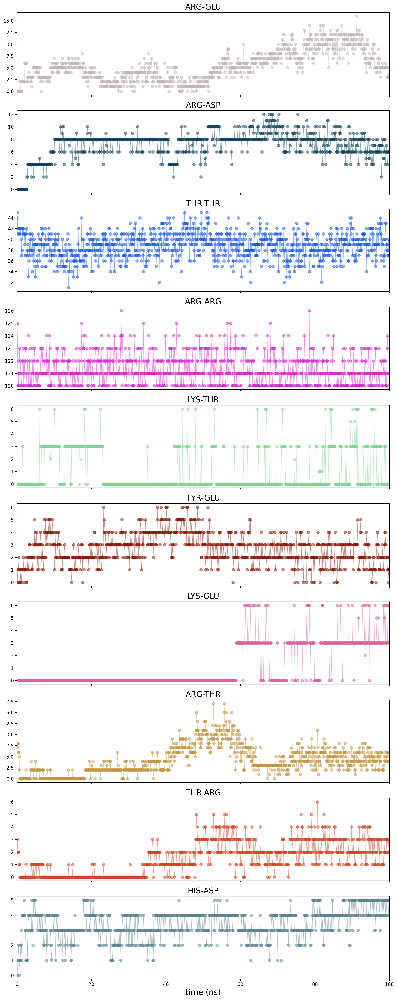

In [69]:
n_rows = len(list(data.keys()))
fig,ax = plt.subplots(n_rows,1,figsize=(12,3*n_rows),sharex=True,dpi=200)

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

for k in range(n_rows):
    key = list(data.keys())[k]
    ax[k].plot(
            timeline,
            data[key],
            color=np.random.rand(3),
            marker='o',
            lw=0.5,
            alpha=0.5
        )
    
    ax[k].set_title(key, fontsize=17)

# customise plot
ax[-1].set_xlabel('time (ns)',fontsize=17)
ax[-1].set_xlim(0,100)
fig.tight_layout()
    
plt.show()

## cWza-Y373C

In [41]:
import MDAnalysis as mda
workdir = "data/cWza-Y373C_conformation1_0337/"
u = mda.Universe(workdir+'md_100ns.tpr', workdir+'md_100ns.xtc',in_memory=True)

In [42]:
from MDAnalysis.analysis.hydrogenbonds.hbond_analysis import HydrogenBondAnalysis as HBA

hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
hbonds.hydrogens_sel = hbonds.guess_hydrogens("protein")
hbonds.acceptors_sel = hbonds.guess_acceptors("protein")
hbonds.run()

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/core/topologyattrs.py:2261: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(sorted(unique_bonds)), 4)
/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/core/topologyobjects.py:600: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  guessed = np.asarray(guessed, dtype=np.bool)


Return the **total number** H-bonds during the simulation length

In [43]:
hbond_counting_raw = hbonds.count_by_type()
hbond_counting_sorted = sorted(hbond_counting_raw, key=lambda x: int(x[-1]), reverse=True)
hbond_counting_sorted

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/analysis/hydrogenbonds/hbond_analysis.py:539: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  d = self.u.atoms[self.hbonds[:, 1].astype(np.int)]
/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/analysis/hydrogenbonds/hbond_analysis.py:543: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar 

[array(['ARG:opls_300', 'ARG:opls_300', '48320'], dtype='<U21'),
 array(['ARG:opls_300', 'ARG:opls_303', '48310'], dtype='<U21'),
 array(['THR:opls_238', 'THR:opls_154', '31343'], dtype='<U21'),
 array(['ARG:opls_303', 'ARG:opls_300', '24767'], dtype='<U21'),
 array(['ARG:opls_300', 'GLU:opls_272', '21582'], dtype='<U21'),
 array(['THR:opls_238', 'THR:opls_272', '7626'], dtype='<U21'),
 array(['SER:opls_238', 'SER:opls_154', '6219'], dtype='<U21'),
 array(['LYS:opls_287', 'THR:opls_272', '5746'], dtype='<U21'),
 array(['ARG:opls_303', 'GLU:opls_272', '4138'], dtype='<U21'),
 array(['THR:opls_154', 'THR:opls_154', '2417'], dtype='<U21'),
 array(['ARG:opls_300', 'THR:opls_272', '2378'], dtype='<U21'),
 array(['HIS:opls_503', 'ASP:opls_272', '2091'], dtype='<U21'),
 array(['ASN:opls_237', 'THR:opls_154', '1421'], dtype='<U21'),
 array(['THR:opls_154', 'THR:opls_272', '1417'], dtype='<U21'),
 array(['ASN:opls_237', 'SER:opls_154', '764'], dtype='<U21'),
 array(['THR:opls_154', 'ASN:opls_23

Extract the residues contributing with most of the H-bonds during the simulation

In [44]:
data_destilated = hbond_counting_sorted[:16]
set_donors_acceptors = set([(x[0].split(':')[0], x[1].split(':')[0]) for x in data_destilated])
set_donors_acceptors

{('ARG', 'ARG'),
 ('ARG', 'GLU'),
 ('ARG', 'THR'),
 ('ASN', 'SER'),
 ('ASN', 'THR'),
 ('HIS', 'ASP'),
 ('LYS', 'THR'),
 ('SER', 'SER'),
 ('THR', 'ASN'),
 ('THR', 'THR')}

In [45]:
N_hbonds_types = len(hbond_counting_sorted)

Y = hbond_counting_sorted
N_hbonds_total_counting_sorted = sum([int(Y[i][-1]) for i in range(len(Y))])

X = data_destilated
N_hbonds_data_destilated = sum([int(X[i][-1]) for i in range(len(X))])

In [46]:
print("Total number of H-bond types: ", N_hbonds_types)
print("Total count of H-bonds during simulation: ", N_hbonds_total_counting_sorted)
print("Total count due to leading H-bonds: ", N_hbonds_data_destilated)
print("Fractional contribution to total", N_hbonds_data_destilated/N_hbonds_total_counting_sorted)

Total number of H-bond types:  53
Total count of H-bonds during simulation:  214255
Total count due to leading H-bonds:  209184
Fractional contribution to total 0.9763319409115306


QUESTIONS

* What are the leading H-bonds contributing with most of the counts during the simulation?
* How many residues are contribution with most of the H-bond counts during the simulation?
* What are their identities?

<span style="color:red">NOTE</span> The issue with the data from the two cells below is that it doesn't discriminate amino acids by their residue number. For example, `ARG`s are located near both terminal ends. 

In [47]:
X = hbond_counting_sorted
set_hdonors = set([x[0].split(':')[0] for x in X])
set_acceptors = set([x[1].split(':')[0] for x in X])
hbond_counting_residues = list(set_hdonors.union(set_acceptors))
print(len(hbond_counting_residues), hbond_counting_residues)

14 ['GLU', 'ILE', 'GLY', 'GLN', 'LEU', 'ARG', 'LYS', 'THR', 'ASN', 'TRP', 'SER', 'ASP', 'VAL', 'HIS']


In [48]:
X = data_destilated
set_hdonors = set([x[0].split(':')[0] for x in X])
set_acceptors = set([x[1].split(':')[0] for x in X])
data_destilated_residues = list(set_hdonors.union(set_acceptors))
print(len(data_destilated_residues),data_destilated_residues)

8 ['LYS', 'THR', 'HIS', 'ASN', 'GLU', 'SER', 'ASP', 'ARG']


### Count H-bonds by time

Count H-bonds **by time** for the donor-acceptor residues with the highest contribution to the total count. Takes about 4mins!

In [49]:
hbonds_time_counting = {}
for k in range(len(list(set_donors_acceptors))):
    # define donor-acceptor residues
    res_donor   = list(set_donors_acceptors)[k][0]
    res_acceptor = list(set_donors_acceptors)[k][1]
    
    # setup and execute hbond analysis
    hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
    hbonds.hydrogens_sel = hbonds.guess_hydrogens("resname "+res_donor)
    hbonds.acceptors_sel = hbonds.guess_acceptors("resname "+res_acceptor)
    hbonds.run()
    
    # store hbonds_time_counting 
    key = res_donor+'-'+res_acceptor
    hbonds_time_counting[key] = hbonds.count_by_time()
    
hbonds_time_counting

{'ARG-ARG': array([120, 122, 120, ..., 121, 120, 123]),
 'ARG-GLU': array([19, 17, 17, ..., 25, 23, 23]),
 'ARG-THR': array([2, 1, 3, ..., 4, 4, 4]),
 'THR-ASN': array([1, 1, 0, ..., 0, 0, 0]),
 'ASN-SER': array([0, 0, 0, ..., 0, 2, 0]),
 'HIS-ASP': array([0, 2, 1, ..., 2, 2, 2]),
 'ASN-THR': array([2, 2, 0, ..., 0, 0, 2]),
 'SER-SER': array([7, 7, 7, ..., 3, 7, 5]),
 'LYS-THR': array([0, 0, 0, ..., 6, 6, 6]),
 'THR-THR': array([40, 45, 47, ..., 41, 42, 44])}

### Leading H-bond contributors protein

In [50]:
set_hdonors = set([x[0].split(':')[0] for x in data_destilated])
set_acceptors = set([x[1].split(':')[0] for x in data_destilated])

In [51]:
hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)

selection = " ".join(list(set_hdonors.union(set_acceptors)))
print(selection)

hbonds.hydrogens_sel = hbonds.guess_hydrogens("resname "+selection)
hbonds.acceptors_sel = hbonds.guess_acceptors("resname "+selection)
hbonds.run()

LYS THR HIS ASN GLU SER ASP ARG


In [52]:
data_leading_residues = hbonds.count_by_time()

In [53]:
hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
hbonds.hydrogens_sel = hbonds.guess_hydrogens("protein")
hbonds.acceptors_sel = hbonds.guess_acceptors("protein")
hbonds.run()

In [54]:
data_protein = hbonds.count_by_time()

Compare H-bonds from leading residues forming H-bonds wrt the whole protein

#### Appendix Figures

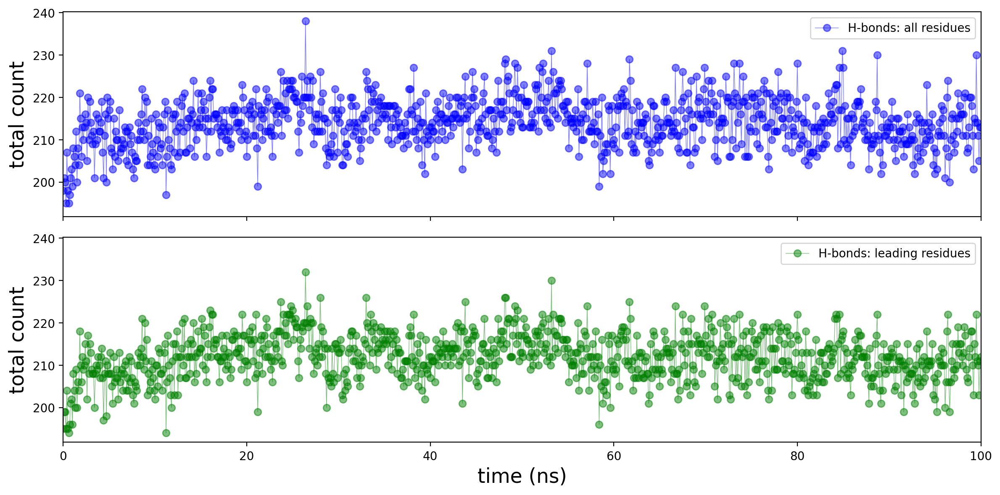

In [56]:
fig,ax = plt.subplots(2,1,figsize=(12,6),sharex=True,sharey=True,dpi=200)

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

ax[0].plot(
    timeline,
    data_protein,
    color='blue',
    marker='o',
    label='H-bonds: all residues',
    lw=0.5,
    alpha=0.5
)

ax[1].plot(
    timeline,
    data_leading_residues,
    color='green',
    marker='o',
    label='H-bonds: leading residues',
    lw=0.5,
    alpha=0.5
)

ax[0].legend()
ax[1].legend()
ax[1].set_xlim(0, 100)
ax[1].set_xlabel("time (ns)",fontsize=17)
ax[0].set_ylabel("total count",fontsize=17)
ax[1].set_ylabel("total count",fontsize=17)
fig.tight_layout()

plt.show()

#### Main Article Figure

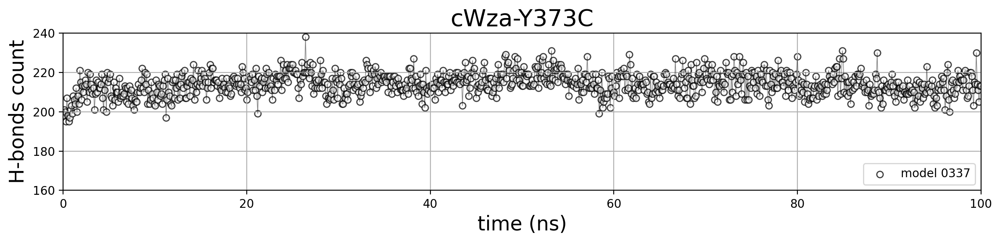

In [67]:
fig,ax = plt.subplots(1,1,figsize=(12,3),sharex=True,sharey=True,dpi=200)

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

label = 'model 0337'
ax.plot(
    timeline,
    data_protein,
    color='black',
    lw=0.5,
    alpha=0.5
)

ax.scatter(
    timeline,
    data_protein,
    s=30,
    color='white',
    edgecolor='black',
    marker='o',
    label=label,
    lw=1,
    alpha=0.75
)

ax.legend(loc='lower right')
ax.set_xlim(0, 100)
ax.set_xlabel("time (ns)",fontsize=17)
ax.set_ylabel("H-bonds count",fontsize=17)
ax.set_title("cWza-Y373C",fontsize=20)
ax.set_ylim(160,240)
ax.grid(True)
fig.tight_layout()

plt.show()

### Save H-bond data 

In [163]:
hbond_data = {}
hbond_data['sorted_total_counting'] = [list(item) for item in hbond_counting_sorted]
hbond_data['time_counting'] = hbonds_time_counting

In [164]:
import pickle
outfile = "data/cWza-Y373C_conformation1_0337/hbond_analysis_data.json"
with open(outfile, 'wb') as f:
    pickle.dump(hbond_data, f, protocol=pickle.HIGHEST_PROTOCOL)

### Plot H-bond time-series

In [191]:
import matplotlib.pyplot as plt
%matplotlib inline

In [192]:
import pickle
infile = "data/cWza-Y373C_conformation1_0337/hbond_analysis_data.json"
with open(infile, 'rb') as f:
    hbond_data = pickle.load(f)

In [193]:
data = hbond_data['time_counting']

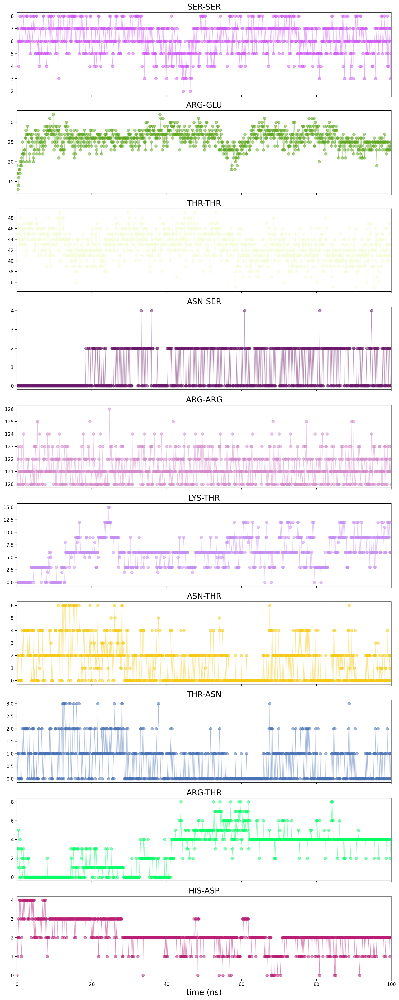

In [194]:
n_rows = len(list(data.keys()))
fig,ax = plt.subplots(n_rows,1,figsize=(12,3*n_rows),sharex=True,dpi=200)

t_initial = 0
t_final = 100
n_frames = 1001
timeline = np.linspace(t_initial,t_final,n_frames)

for k in range(n_rows):
    key = list(data.keys())[k]
    ax[k].plot(
            timeline,
            data[key],
            color=np.random.rand(3),
            marker='o',
            lw=0.5,
            alpha=0.5
        )
    
    ax[k].set_title(key, fontsize=17)

# customise plot
ax[-1].set_xlabel('time (ns)',fontsize=17)
ax[-1].set_xlim(0,100)
fig.tight_layout()
    
plt.show()

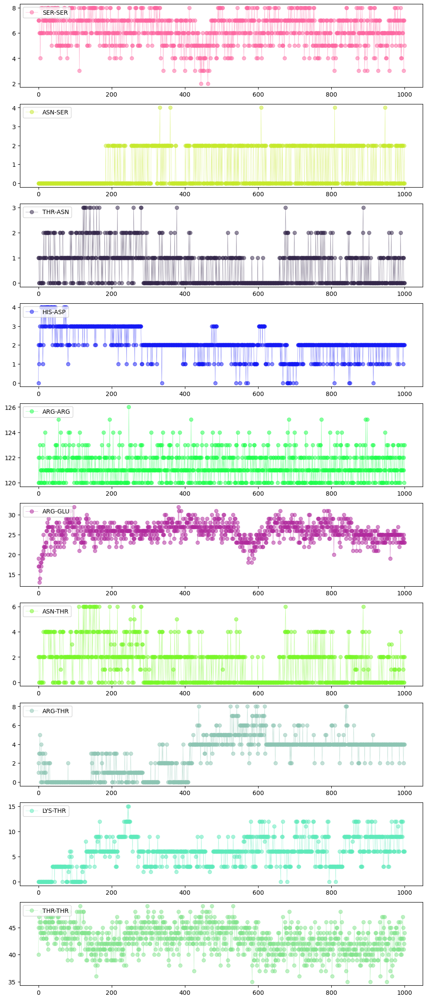

In [353]:
fig,ax = plt.subplots(len(list(data.keys())),1,figsize=(12,3*len(list(data.keys()))),dpi=100)

for k in range(len(list(data.keys()))):
    key = list(data.keys())[k]
    ax[k].plot(data[key],color=np.random.rand(3),marker='o',label=key,lw=0.5,alpha=0.5)
    ax[k].legend(loc='upper left')
    
plt.show()

In [354]:
set_hdonors = set([x[0].split(':')[0] for x in data_destilated])
set_acceptors = set([x[1].split(':')[0] for x in data_destilated])

In [356]:
' '.join(list(set_hdonors.union(set_acceptors)))

'HIS SER ARG ASN ASP LYS GLU THR'

In [357]:
hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
hbonds.hydrogens_sel = hbonds.guess_hydrogens("resname HIS SER ARG ASN ASP LYS GLU THR")
hbonds.acceptors_sel = hbonds.guess_acceptors("resname HIS SER ARG ASN ASP LYS GLU THR")
hbonds.run()

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/core/topologyattrs.py:2261: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(sorted(unique_bonds)), 4)
/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/core/topologyobjects.py:600: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  guessed = np.asarray(guessed, dtype=np.bool)


In [358]:
data_leading_residues = hbonds.count_by_time()

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/analysis/hydrogenbonds/hbond_analysis.py:521: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  counts[indices.astype(np.int)] = tmp_counts


In [359]:
hbonds = HBA(universe=u,d_h_a_angle_cutoff=30)
hbonds.hydrogens_sel = hbonds.guess_hydrogens("protein")
hbonds.acceptors_sel = hbonds.guess_acceptors("protein")
hbonds.run()

In [360]:
data_protein = hbonds.count_by_time()

Compare H-bonds from leading residues forming H-bonds wrt the whole protein

In [361]:
data_leading_residues

array([195, 199, 199, ..., 203, 211, 212])

In [362]:
data_protein

array([198, 201, 200, ..., 205, 213, 213])

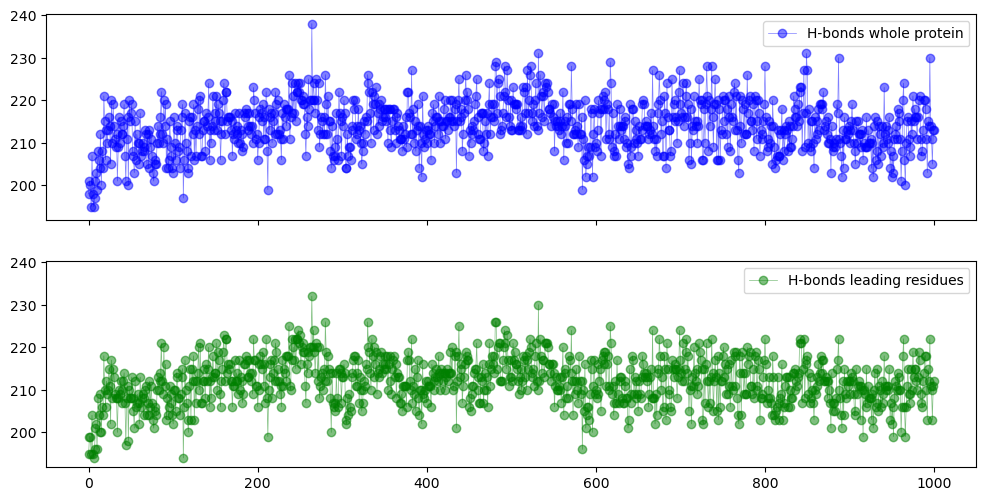

In [363]:
fig,ax = plt.subplots(2,1,figsize=(12,6),sharex=True,sharey=True,dpi=100)

ax[0].plot(data_protein,color='blue',marker='o',label='H-bonds whole protein',lw=0.5,alpha=0.5)
ax[1].plot(data_leading_residues,color='green',marker='o',label='H-bonds leading residues',lw=0.5,alpha=0.5)

ax[0].legend()
ax[1].legend()
plt.show()

# PyMOL

```python
load md_100ns.gro
load_traj md_100ns.xtc
save frame_20ns.pdb, polymer.protein, 200
save frame_80ns.pdb, polymer.protein, 800
```


Fix pdb frames
```bash
pymol -qc add_chain_numbers.py -- frame_80ns.pdb frame_80ns_chains.pdb
```

# Plot RMSF per mutant and conformation

In [25]:
data_folder = "data/md_traj_analysis/"

In [26]:
clean_line = lambda line: list(map(float, line.strip().split()))
exclude_regex = lambda line: not re.search("#|@",line)

In [27]:
mutant_names = ['cWza', 'cWza-K375C', 'cWza-S355C', 'cWza-Y373C']

## Raw data

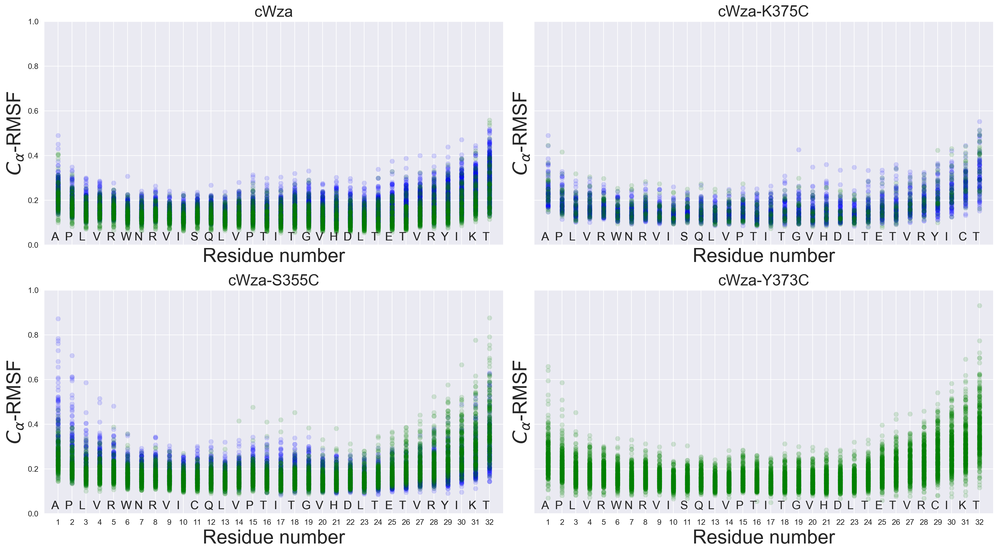

In [28]:
sns.set_style("darkgrid")
fig, ax = plt.subplots(2,2,figsize=(18,10),dpi=200, sharex=True, sharey=True)

Axes = {
    'cWza': ax[0][0],
    'cWza-K375C': ax[0][1],
    'cWza-S355C': ax[1][0],
    'cWza-Y373C': ax[1][1]
}

Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

Colors = {0:"blue", 1:'green'}

Sequences = {
    'cWza': 'APLVRWNRVISQLVPTITGVHDLTETVRYIKT',
    'cWza-K375C' : 'APLVRWNRVISQLVPTITGVHDLTETVRYICT',
    'cWza-S355C': 'APLVRWNRVICQLVPTITGVHDLTETVRYIKT',
    'cWza-Y373C': 'APLVRWNRVISQLVPTITGVHDLTETVRCIKT'
}

for mutant in mutant_names:
    ax = Axes[mutant]
    for g in Conformations[mutant]: 
        files=glob.glob(data_folder+mutant+'_'+'conformation'+str(g)+'_'+'*rmsf_C-alpha.xvg')
        
        for path in files:
            data = [clean_line(l) for l in open(
                path, 'r').readlines() if exclude_regex(l)]
            data = np.array(data)

            ax.scatter(*data.T, color=Colors[g], lw=0.25, alpha=0.15)

        ax.set_xticks(range(1,33))
        for resn in range(32):
            ax.text(resn+0.5, 0.02,Sequences[mutant][resn],fontsize=15)

    ax.set_title(mutant, fontsize=20)
    ax.set_xlabel("Residue number", fontsize=25)
    ax.set_ylabel("$C_\\alpha$-RMSF", fontsize=25)

ax.set_xlim(0, 33)
ax.set_ylim(0, 1)

fig.tight_layout()
plt.show()

## Averaged data

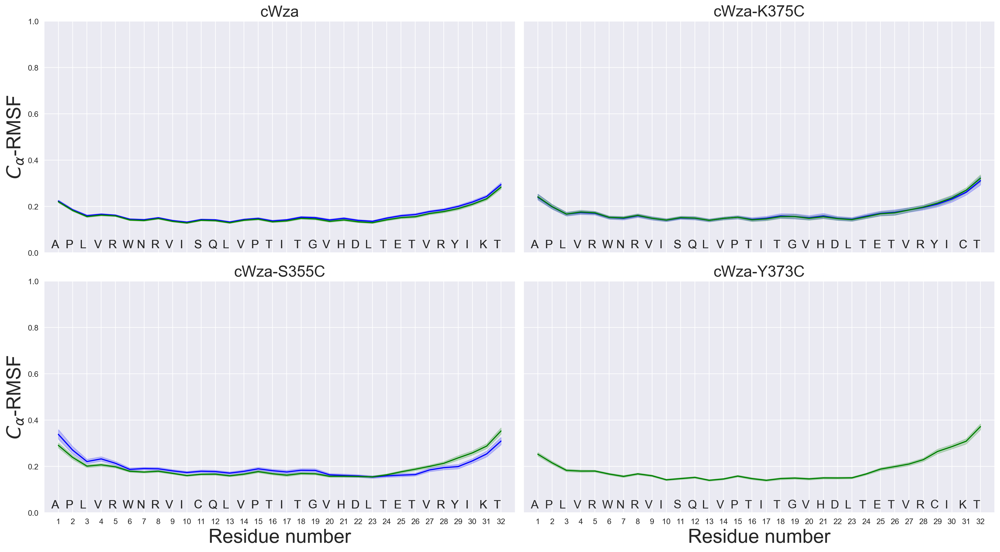

In [29]:
sns.set_style("darkgrid")
fig, ax = plt.subplots(2,2,figsize=(18,10),dpi=200, sharex=True, sharey=True)

Axes = {
    'cWza': ax[0][0],
    'cWza-K375C': ax[0][1],
    'cWza-S355C': ax[1][0],
    'cWza-Y373C': ax[1][1]
}

Conformations = {
    'cWza': [0, 1],
    'cWza-K375C': [0, 1],
    'cWza-S355C': [0, 1],
    'cWza-Y373C': [1]    
}

Colors = {0:"blue", 1:'green'}

Sequences = {
    'cWza': 'APLVRWNRVISQLVPTITGVHDLTETVRYIKT',
    'cWza-K375C' : 'APLVRWNRVISQLVPTITGVHDLTETVRYICT',
    'cWza-S355C': 'APLVRWNRVICQLVPTITGVHDLTETVRYIKT',
    'cWza-Y373C': 'APLVRWNRVISQLVPTITGVHDLTETVRCIKT'
}

test_data = {}

for mutant in mutant_names:
    ax = Axes[mutant]
    test_data['residue'] = []
    test_data['rmsf'] = []
    
    for g in Conformations[mutant]: 
        files=glob.glob(data_folder+mutant+'_'+'conformation'+str(g)+'_'+'*rmsf_C-alpha.xvg')
        
        for path in files:
            data = [clean_line(l) for l in open(
                path, 'r').readlines() if exclude_regex(l)] 
            data = np.array(data).T
            X = data[0]; Y = data[1]
            test_data['residue'] = test_data['residue'] + list(X)
            test_data['rmsf'] = test_data['rmsf'] + list(Y)

        df = pd.DataFrame(test_data)
        sns.lineplot(x='residue',y='rmsf',data = df,color=Colors[g], ax=ax)
        ax.set_xticks(range(1,33))
        for resn in range(32):
            ax.text(resn+0.5, 0.02,Sequences[mutant][resn],fontsize=15)

    ax.set_title(mutant, fontsize=20)
    ax.set_xlabel("Residue number", fontsize=25)
    ax.set_ylabel("$C_\\alpha$-RMSF", fontsize=25)

ax.set_xlim(0, 33)
ax.set_ylim(0, 1)

fig.tight_layout()
plt.show()

In [67]:
import os
import sys
import json
import pandas
import seaborn
import operator
import concurrent.futures
from sqlalchemy import create_engine
from sqlalchemy.orm import sessionmaker

import matplotlib.pyplot as plt

In [128]:
from setup_db_metrics import Base, Tags, Pore_Dimensions, Radii_of_Gyration

In [77]:
dbfile = 'data/conf_metrics_Last10ns.db'

# Create engine and bind it to current session
engine = create_engine('sqlite:///'+dbfile)
Base.metadata.bind = engine
DBSession = sessionmaker(bind=engine)
session = DBSession()

In [78]:
TAGS = [
    ['cWza', 'conformation0'],
    ['cWza', 'conformation1'],
    ['cWza-K375C', 'conformation0'],
    ['cWza-K375C', 'conformation1'],
    ['cWza-S355C', 'conformation0'],
    ['cWza-S355C', 'conformation1'],
    ['cWza-Y373C', 'conformation1']
    ]

TAGS = [json.dumps(tag) for tag in TAGS]

In [114]:
DFS = {}
for tag in TAGS:
    mutant, conformation = json.loads(tag)
    models_ids = session.query(Tags.id).filter_by(mutant=mutant, group=conformation).all()
    models_ids = [x[0] for x in models_ids]
    print(len(models_ids))
    
    data = []
    for id in models_ids:
        try: 
            x = session.query(Pore_Dimensions.pore_length).filter_by(id=id)[0][0]        
            y = session.query(Pore_Dimensions.pore_Rmin).filter_by(id=id)[0][0]
            data.append([x,y])
        except:
            print("No data for id", id)
    

    DFS[tag] = pandas.DataFrame(data, columns=['length','Rmin'])

839
305
166
152
405
632
582


In [163]:
# models_ids = session.query(Tags.id).filter_by(mutant='cWza',frame='Protein_975').all()
pdb_name0 = 'refined1_0001_INPUT_0047_ignorechain'
models_ids = session.query(Tags.id).filter_by(mutant='cWza',group='conformation1', pdb_name=pdb_name0).all()
models_ids = [x[0] for x in models_ids]

print(len(models_ids))
testdata = []
for id in models_ids:
    x = session.query(Pore_Dimensions.pore_length).filter_by(id=id)[0][0]        
    y = session.query(Pore_Dimensions.pore_Rmin).filter_by(id=id)[0][0]
    group = session.query(Tags.group).filter_by(id=id)[0][0]
    pdb_name = session.query(Tags.pdb_name).filter_by(id=id)[0][0]
    mutant = session.query(Tags.mutant).filter_by(id=id)[0][0]
    frame = session.query(Tags.frame).filter_by(id=id)[0][0]
    testdata.append(frame)
    print(id,[x,y], group, mutant, frame, pdb_name == pdb_name0)

56
630 [39.1175, 8.13735] conformation1 cWza Protein_901 True
631 [39.008750000000006, 8.33563] conformation1 cWza Protein_905 True
632 [39.2975, 7.8274] conformation1 cWza Protein_906 True
633 [39.49125, 7.22182] conformation1 cWza Protein_913 True
634 [39.1775, 7.69792] conformation1 cWza Protein_902 True
635 [39.3875, 8.029] conformation1 cWza Protein_904 True
636 [39.0325, 7.82308] conformation1 cWza Protein_917 True
637 [39.254999999999995, 7.68256] conformation1 cWza Protein_908 True
638 [39.0875, 7.74078] conformation1 cWza Protein_910 True
639 [38.760000000000005, 7.24948] conformation1 cWza Protein_918 True
640 [39.06125, 7.97291] conformation1 cWza Protein_921 True
641 [38.58624999999999, 7.5526] conformation1 cWza Protein_930 True
642 [38.08, 7.67304] conformation1 cWza Protein_920 True
643 [38.338750000000005, 8.16492] conformation1 cWza Protein_923 True
644 [38.4775, 8.25895] conformation1 cWza Protein_925 True
645 [38.53875, 8.17393] conformation1 cWza Protein_929 True
64

In [165]:
testdata.sort()

In [167]:
len(testdata)

56

In [115]:
x = [
839,
305,
166,
152,
405,
632,
582]

In [116]:
sum(x)

3081

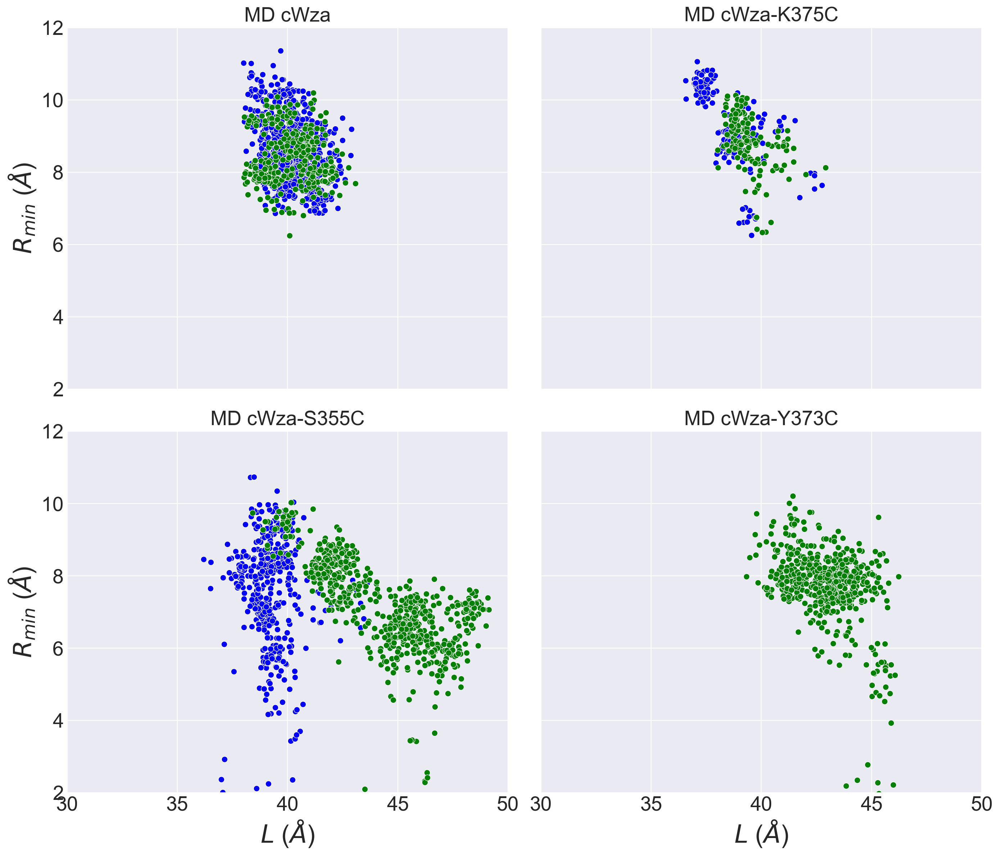

In [113]:
MUTANTS = ['cWza','cWza-K375C','cWza-S355C','cWza-Y373C']

CONFORMATIONS = {
    'cWza':['conformation0', 'conformation1'],
    'cWza-K375C':['conformation0', 'conformation1'],
    'cWza-S355C':['conformation0', 'conformation1'],
    'cWza-Y373C':['conformation1'],
}

fig, ax = plt.subplots(2,2,figsize=(14,12),sharex=True, sharey=True,dpi=200)
seaborn.set_style('darkgrid')

axes = {
    'cWza':ax[0,0],
    'cWza-K375C':ax[0,1],
    'cWza-S355C':ax[1,0],
    'cWza-Y373C':ax[1,1]
}

COLOURS = {
    'conformation0':'blue',
    'conformation1':'green'
}

for tag in TAGS:
    mutant,conformation = json.loads(tag)
    seaborn.scatterplot(
        x='length',
        y='Rmin',
        data=DFS[tag],
        color=COLOURS[conformation],
        ax=axes[mutant]
    )
    ###############################################                            
    # Customise plot
    ###############################################
    axes[mutant].set_title("MD "+mutant, fontsize=20)
    axes[mutant].tick_params(axis='both',direction='in',labelsize=20)
    axes[mutant].set_xlabel("$L$ ($\AA$)",fontsize=25)
    axes[mutant].set_ylabel("$R_{min}$ ($\AA$)",fontsize=25)
    axes[mutant].set_xlim(30,50)
    axes[mutant].set_ylim(2,12)

plt.tight_layout()
plt.show()

```
for n in `seq -f "%04g" 1 1000`; do line=$(grep "TAG" refined1_0001_INPUT_${n}_ignorechain.hole_dat); echo $n $line; done > cWza_hole_1-1000.raw_dat
```

# APPENDIX

Script to add chain numbers to protein PDBs extracted from `md_100ns.gro` files

```python
from pymol import cmd
import sys

pdb_in = sys.argv[1] # Input PDB path
pdb_out = sys.argv[2] # Output PDB path

cmd.load(pdb_in,"MyProtein")
N_atoms = cmd.count_atoms("MyProtein")

Chains = ['A', 'B','C','D','E','F','G','H']

atoms_per_chain = N_atoms/len(Chains)

for k in range(len(Chains)):
    atom_number_intial = int( 1 + k*atoms_per_chain )
    atom_number_final  = int( (k + 1)*atoms_per_chain )
    selection = "id "+ str(atom_number_intial) + ":" + str(atom_number_final)
    expression = "chain='"+Chains[k]+"'"
    cmd.alter(selection, expression)

cmd.set("retain_order",1)
cmd.save(pdb_out ,"MyProtein")
```

Commands to fix all chains in all models using a Python script

```bash
for pdb in `ls md_selected_models/*md_100ns.pdb`; do 
    pymol -qc ../add_chain_numbers.py -- $pdb ${pdb%.pdb}_FIXED-CHAINS.pdb; 
done
```

Simple Python script to overlay docking, MD, and wild-type Wza-D4 models

```python
from pymol import cmd
import sys

pdb1 = sys.argv[1] # PDB docking model
pdb2 = sys.argv[2] # PDB md_100ns model
wza_pdb = "data/md_selected_models/wzaD4-consensus-full.pdb"

cmd.load(pdb1,"docking")
cmd.load(pdb2,"md_100ns")
cmd.load(wza_pdb,"wza")

cmd.align("docking", "wza")
cmd.align("md_100ns", "wza")

cmd.hide("spheres","all")
cmd.show("cartoon","all")
cmd.show("sticks",'resname tyr+cys')
cmd.set("orthoscopic",1)
cmd.bg_color('white')
```

### Inspection of residues at bottleneck

Compute distance between residue pairs in trajectory showing conductance transition

Tutorial: https://userguide.mdanalysis.org/1.0.1/examples/analysis/distances_and_contacts/distances_between_selections.html

__NOTE__ This solve the import issue temporarily only!

In [8]:
import sys
sys.path[7] = ''

In [9]:
sys.path

['/data/dragon000/sanjuan/bristol/cwza/phd-notebooks/Analyses/figures_nbs',
 '/data/dragon000/sanjuan/anaconda3/bin/python',
 '/data/dragon000/sanjuan/research/SAbDab/lib/python/ABDB',
 '/data/dragon000/sanjuan/anaconda3/lib/python38.zip',
 '/data/dragon000/sanjuan/anaconda3/lib/python3.8',
 '/data/dragon000/sanjuan/anaconda3/lib/python3.8/lib-dynload',
 '',
 '',
 '/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages',
 '/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/ldds-0.1.0-py3.8.egg',
 '/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/fv_modeller-0.0.1-py3.8.egg',
 '/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/ABlooper-1.0.9-py3.8.egg',
 '/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/locket-0.2.1-py3.8.egg',
 '/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/IPython/extensions',
 '/homes/sanjuan/.ipython']

In [10]:
import MDAnalysis as mda
from MDAnalysis.tests.datafiles import PDB_small
from MDAnalysis.analysis import distances

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [13]:
u = mda.Universe(PDB_small) 

/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/topology/PDBParser.py:330: UserWarning: Element information is absent or missing for a few atoms. Elements attributes will not be populated.
  warnings.warn("Element information is absent or missing for a few "
/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/topology/base.py:203: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  residx = np.zeros_like(criteria[0], dtype=np.int)


In [14]:
LID_ca = u.select_atoms('name CA and resid 122-159')
NMP_ca = u.select_atoms('name CA and resid 30-59')

n_LID = len(LID_ca)
n_NMP = len(NMP_ca)
print('LID has {} residues and NMP has {} residues'.format(n_LID, n_NMP))

LID has 38 residues and NMP has 30 residues


/data/dragon000/sanjuan/anaconda3/lib/python3.8/site-packages/MDAnalysis/core/selection.py:690: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros(len(vals), dtype=np.bool)


In [15]:
dist_arr = distances.distance_array(LID_ca.positions, # reference
                                    NMP_ca.positions, # configuration
                                    box=u.dimensions)
dist_arr.shape

(38, 30)

Text(0, 0.5, 'Distance (Angstrom)')

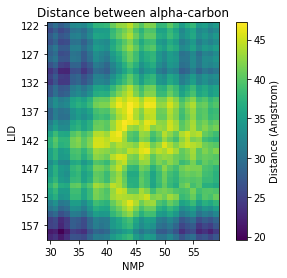

In [16]:
fig, ax = plt.subplots()
im = ax.imshow(dist_arr, origin='upper')

# add residue ID labels to axes
tick_interval = 5
ax.set_yticks(np.arange(n_LID)[::tick_interval])
ax.set_xticks(np.arange(n_NMP)[::tick_interval])
ax.set_yticklabels(LID_ca.resids[::tick_interval])
ax.set_xticklabels(NMP_ca.resids[::tick_interval])

# add figure labels and titles
plt.ylabel('LID')
plt.xlabel('NMP')
plt.title('Distance between alpha-carbon')

# colorbar
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('Distance (Angstrom)')

Distances between residues

In [17]:
LID = u.select_atoms('resid 122-159')
NMP = u.select_atoms('resid 30-59')

LID_com = LID.center_of_mass(compound='residues')
NMP_com = NMP.center_of_mass(compound='residues')

n_LID = len(LID_com)
n_NMP = len(NMP_com)

print('LID has {} residues and NMP has {} residues'.format(n_LID, n_NMP))

LID has 38 residues and NMP has 30 residues


In [18]:
res_dist = distances.distance_array(LID_com, NMP_com,
                                    box=u.dimensions)

/tmp/ipykernel_2441428/3118276872.py:17: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar2 = fig2.colorbar(im)


Text(0, 0.5, 'Distance (Angstrom)')

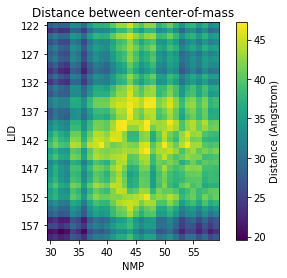

In [19]:
fig2, ax2 = plt.subplots()
im2 = ax2.imshow(res_dist, origin='upper')

# add residue ID labels to axes
tick_interval = 5
ax2.set_yticks(np.arange(n_LID)[::tick_interval])
ax2.set_xticks(np.arange(n_NMP)[::tick_interval])
ax2.set_yticklabels(LID.residues.resids[::tick_interval])
ax2.set_xticklabels(NMP.residues.resids[::tick_interval])

# add figure labels and titles
plt.ylabel('LID')
plt.xlabel('NMP')
plt.title('Distance between center-of-mass')

# colorbar
cbar2 = fig2.colorbar(im)
cbar2.ax.set_ylabel('Distance (Angstrom)')

### residue-residue distance analysis

In [134]:
import MDAnalysis as mda
workdir = "data/cWza-S355C_conformation1_0050/"
u = mda.Universe(workdir+'md_100ns.tpr', workdir+'md_100ns.xtc',in_memory=True)

In [107]:
chains = "abcdefgh"
k = 0 # chain selection

selection = "resname TYR and segid "+"seg_"+str(k)+"_Protein_chain_"+chains[k].upper()
tyrosines = u.select_atoms(selection, updating=True)

selection = "resname GLU and segid "+"seg_"+str(k)+"_Protein_chain_"+chains[k].upper()
glutamates = u.select_atoms(selection, updating=True)

In [108]:
data = []
for ts in u.trajectory:
    tyr_com = tyrosines.center_of_mass()
    glu_com = glutamates.center_of_mass()
    distance_tyr_glu = np.linalg.norm(tyr_com - glu_com)
    data.append(distance_tyr_glu)

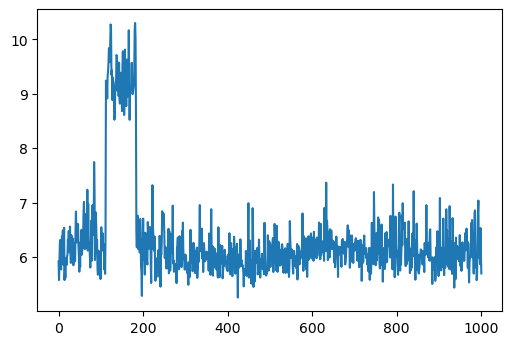

In [109]:
fig,ax = plt.subplots(1,1, dpi=100)
ax.plot(data)
plt.show()

Put all together

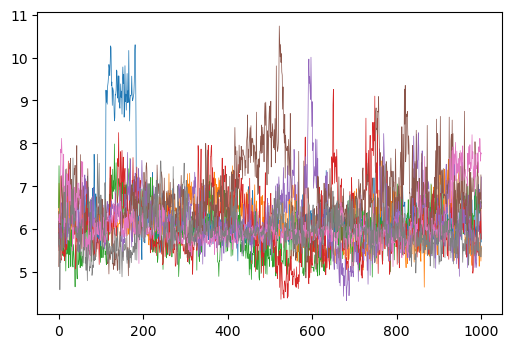

In [124]:
fig,ax = plt.subplots(1,1,dpi=100)

chains = "abcdefgh"

for k in range(len(chains)):

    tyr_selection = "resname TYR and segid "+"seg_"+str(k)+"_Protein_chain_"+chains[k].upper()
    glu_selection = "resname GLU and segid "+"seg_"+str(k)+"_Protein_chain_"+chains[k].upper()
    tyrosines = u.select_atoms(tyr_selection, updating=True)
    glutamates = u.select_atoms(glu_selection, updating=True)

    data = []
    for ts in u.trajectory:
        tyr_com = tyrosines.center_of_mass()
        glu_com = glutamates.center_of_mass()
        distance_tyr_glu = np.linalg.norm(tyr_com - glu_com)
        data.append(distance_tyr_glu)
        
    ax.plot(data, label='chain '+chains[k],lw=0.5)
        
plt.show()

In [128]:
tyr_selection = "resname TYR"
glu_selection = "resname GLU"
tyrosines = u.select_atoms(tyr_selection, updating=True)
glutamates = u.select_atoms(glu_selection, updating=True)

data = []
for ts in u.trajectory:
    tyr_com = tyrosines.center_of_mass()
    glu_com = glutamates.center_of_mass()
    distance_tyr_glu = tyr_com - glu_com
    data.append(distance_tyr_glu)

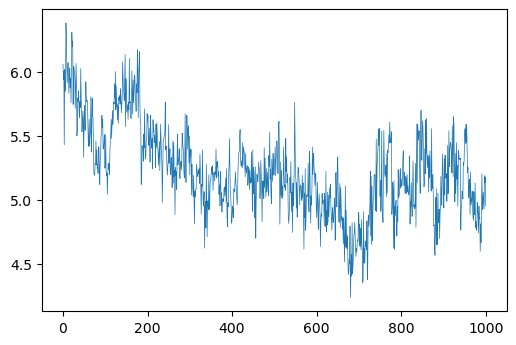

In [132]:
fig,ax=plt.subplots(1,1,dpi=100)

ax.plot(np.linalg.norm(np.array(data),axis=1),lw=0.5)
plt.show()

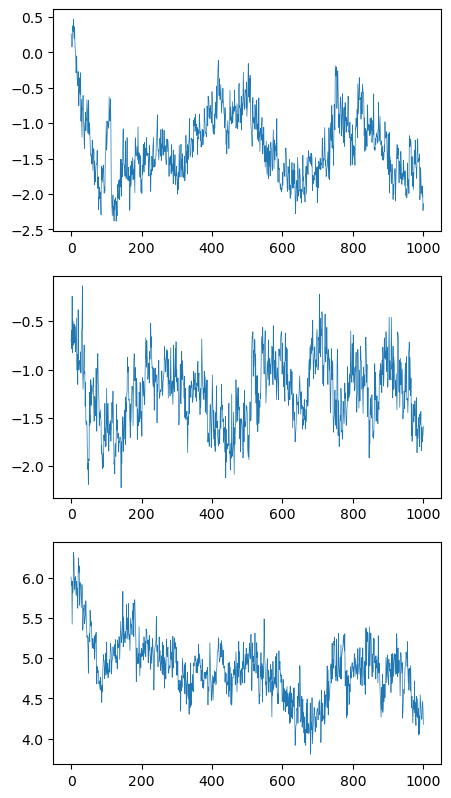

In [131]:
fig,ax = plt.subplots(3,1,figsize=(5,10),dpi=100)

for k in range(3):
    ax[k].plot(np.array(data).T[k],lw=0.5)

plt.show()

# TO-DOs

* Have a look at MDanalysis selections https://userguide.mdanalysis.org/dev/selections.html#selections 